In [1]:
import mat73

In [6]:
data_dict= mat73.loadmat('/Users/ritwikghosh/Downloads/ProcData/EEG/Signals/KM26_s01/erp_v1.mat')

In [7]:
data_dict['erp'].shape

(70, 2701, 292)

In [829]:
1100:1850

/Users/ritwikghosh


In [5]:
data_dict['log'][:,1][1]

21.0

In [163]:
smell_21= data_dict['erp'][30,1100:1850,1]
smell_10= data_dict['erp'][30,1100:1850,8]

In [164]:
from gtda.time_series import TakensEmbedding,SingleTakensEmbedding
from gtda.time_series import Resampler, SlidingWindow, takens_embedding_optimal_parameters, \
    TakensEmbedding, PermutationEntropy, SingleTakensEmbedding

from gtda.plotting import plot_point_cloud

homology_dimensions = [0,1,2,3]
embedding_dimension = 20
embedding_time_delay = 20
stride = 1
STE = SingleTakensEmbedding(
    parameters_type="search", n_jobs=-1, time_delay=10, dimension=5, stride=stride
)

y_21 = STE.fit_transform(smell_21)
y_10= STE.fit_transform(smell_10)

In [165]:
y_10.shape

(723, 4)

In [166]:
from gtda.homology import VietorisRipsPersistence
from gtda.homology import WeakAlphaPersistence, VietorisRipsPersistence
from gtda.diagrams import Scaler, Filtering, PersistenceEntropy, BettiCurve, PairwiseDistance
from gtda.time_series import PermutationEntropy


# 0 - connected components, 1 - loops, 2 - voids
homology_dimensions = [0, 1, 2]

# Collapse edges to speed up H2 persistence calculation!
VR = VietorisRipsPersistence(
    metric="euclidean",
    homology_dimensions=homology_dimensions,
    n_jobs=-1,
    collapse_edges=True,
)
#persistence = VietorisRipsPersistence(homology_dimensions=[0, 1], n_jobs=-1)
scaling = Scaler()
entropy = PersistenceEntropy(normalize=True, nan_fill_value=-99999999)

diagram_21 = VR.fit_transform([y_21])
diagram_10= VR.fit_transform([y_10])

In [167]:
diagram_21.shape

(1, 959, 3)

In [168]:
B= BettiCurve(n_bins=300)
BC_21=B.fit_transform(diagram_21)[0].T
BC_10=B.fit_transform(diagram_10)[0].T

1 Trial , 1 Channel, 1 Subject , SmellID - 21

In [7]:
import os
import mat73
import numpy as np
import pickle

# Path to the directory containing all subjects
base_path = '/Users/ritwikghosh/Downloads/ProcData/EEG/Signals/'

# Initialize the final dictionary to store ERP mean signals
erp_dict_all = {}

# Define the range of samples to extract (1100 to 1850)
start_idx = 1100
end_idx = 1850

# Iterate over each subject folder
for subject_folder in os.listdir(base_path):
    subject_path = os.path.join(base_path, subject_folder)
    
    # Check if it's a directory and contains 'erp_v1.mat'
    if os.path.isdir(subject_path) and 'erp_v1.mat' in os.listdir(subject_path):
        # Load the data
        data_dict = mat73.loadmat(os.path.join(subject_path, 'erp_v1.mat'))

        # Extract relevant information
        eeg_data = data_dict['erp']  # EEG data
        log_data = data_dict['log']  # Log data

        # Find unique smell ids
        unique_smell_ids = np.unique(log_data[:, 1])

        # Iterate over each channel
        for channel_idx in range(64):  # Assuming there are 64 channels
            # Initialize a list to store ERP mean signals for the current subject and channel
            erp_dict_all[(subject_folder, channel_idx)] = {'Signal': [], 'Smell_ID': []}

            # Iterate over each unique smell id
            for smell_id in unique_smell_ids:
                # Find indices of trials corresponding to the current smell_id
                trial_indices = np.where(log_data[:, 1] == smell_id)[0]

                # Initialize an array to store EEG signals for the current smell_id
                eeg_signals = np.zeros((end_idx - start_idx,))

                # Iterate over each trial for the current smell_id
                for trial_idx in trial_indices:
                    # Extract EEG signal for the specified channel and trial, and slice the desired range
                    eeg_signal = eeg_data[channel_idx, start_idx:end_idx, trial_idx]

                    # Add the EEG signal to the array
                    eeg_signals += eeg_signal

                # Calculate the mean EEG signal for the current smell_id
                mean_eeg_signal = eeg_signals / len(trial_indices)

                # Add the mean EEG signal and corresponding smell_id to the dictionary
                erp_dict_all[(subject_folder, channel_idx)]['Signal'].append(mean_eeg_signal)
                erp_dict_all[(subject_folder, channel_idx)]['Smell_ID'].append(smell_id)

            # Convert the lists in the dictionary to numpy arrays
            erp_dict_all[(subject_folder, channel_idx)]['Signal'] = np.array(erp_dict_all[(subject_folder, channel_idx)]['Signal'])
            erp_dict_all[(subject_folder, channel_idx)]['Smell_ID'] = np.array(erp_dict_all[(subject_folder, channel_idx)]['Smell_ID'])

# Save the dictionary as a .pkl file
with open('/Users/ritwikghosh/Downloads/ProcData/ERP_mean_signals.pkl', 'wb') as f:
    pickle.dump(erp_dict_all, f)

print("ERP mean signals for all subjects and channels have been saved to '/Users/ritwikghosh/Downloads/ProcData/ERP_mean_signals.pkl'.")


ERP mean signals for all subjects and channels have been saved to '/Users/ritwikghosh/Downloads/ProcData/ERP_mean_signals.pkl'.


In [59]:
import mat73
import numpy as np

# Load the data
data_dict = mat73.loadmat('/Users/ritwikghosh/Downloads/ProcData/EEG/Signals/KM26_s02/erp_v1.mat')

# Extract relevant information
eeg_data = data_dict['erp']  # EEG data
log_data = data_dict['log']  # Log data

# Find unique smell ids
unique_smell_ids = np.unique(log_data[:, 1])

# Initialize a dictionary to store the ERP mean signal with corresponding smell id
erp_dict = {'Signal': [], 'Smell_ID': []}

# Specify the channel (assuming it's 30 as per the example)
channel_idx = 30

# Iterate over each unique smell id
for smell_id in unique_smell_ids:
    # Find indices of trials corresponding to the current smell_id
    trial_indices = np.where(log_data[:, 1] == smell_id)[0]
    
    # Initialize an array to store EEG signals for the current smell_id
    eeg_signals = np.zeros((eeg_data.shape[1],))
    
    # Iterate over each trial for the current smell_id
    for trial_idx in trial_indices:
        # Extract EEG signal for the specified channel and trial
        eeg_signal = eeg_data[channel_idx, :, trial_idx]
        
        # Add the EEG signal to the array
        eeg_signals += eeg_signal
    
    # Calculate the mean EEG signal for the current smell_id
    mean_eeg_signal = eeg_signals / len(trial_indices)
    
    # Add the mean EEG signal and corresponding smell_id to the dictionary
    erp_dict['Signal'].append(mean_eeg_signal)
    erp_dict['Smell_ID'].append(smell_id)

# Convert the lists in the dictionary to numpy arrays
erp_dict['Signal'] = np.array(erp_dict['Signal'])
erp_dict['Smell_ID'] = np.array(erp_dict['Smell_ID'])

# Print the ERP mean signal with corresponding smell_id for channel 30
print("ERP mean signal for channel 30 with corresponding smell_id:")
for i in range(len(erp_dict['Signal'])):
    print(f"Smell ID: {erp_dict['Smell_ID'][i]}, Signal: {erp_dict['Signal'][i]}")


ERP mean signal for channel 30 with corresponding smell_id:
Smell ID: 2.0, Signal: [ 2.73386542  2.6921857   2.636238   ... -0.15178404 -0.22036011
 -0.26889786]
Smell ID: 3.0, Signal: [-5.28321004 -5.28155518 -5.29270565 ... -0.77526437 -0.814866
 -0.8419433 ]
Smell ID: 6.0, Signal: [-0.61903975 -0.57239902 -0.52350796 ... -0.73534336 -0.67428409
 -0.63021529]
Smell ID: 7.0, Signal: [-4.81067265 -4.82136328 -4.82323757 ... -1.34409925 -1.43783095
 -1.49608078]
Smell ID: 9.0, Signal: [0.57262351 0.62840899 0.69948682 ... 0.96377477 0.95428413 0.95776226]
Smell ID: 10.0, Signal: [1.33770647 1.39851038 1.48270448 ... 3.53889813 3.48512611 3.44495044]
Smell ID: 16.0, Signal: [1.83642986 1.8911378  1.9663126  ... 1.0745128  1.10266668 1.12033415]
Smell ID: 17.0, Signal: [0.41963512 0.5112593  0.62109768 ... 3.17483267 3.15666242 3.1377094 ]
Smell ID: 21.0, Signal: [-2.31947473 -2.34324437 -2.37638077 ...  1.89622495  1.90266313
  1.89476507]
Smell ID: 22.0, Signal: [1.01450593 1.0129197  1

In [3]:
erp_dict['Signal'].shape

(10, 2701)

In [9]:
s1=erp_dict['Signal'][0,:]

In [960]:
erp_dict['Smell_ID'].shape

(10,)

In [10]:
s1.shape

(2701,)

In [961]:
erp_dict['Signal'].shape

(10, 2701)

In [961]:
erp_dict['Signal'].shape

(10, 2701)

In [60]:
import numpy as np

# Extracting the required slices from the signals
s1 = erp_dict['Signal'][0, 1100:1850]
s2 = erp_dict['Signal'][9, 1100:1850]

# Stacking them to form a matrix of shape (700, 2)
result_matrix = np.stack((s1, s2), axis=1)


In [87]:
from gtda.time_series import TakensEmbedding
TE= TakensEmbedding(time_delay=10, dimension=3)
Embedding=TE.fit_transform([s1])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


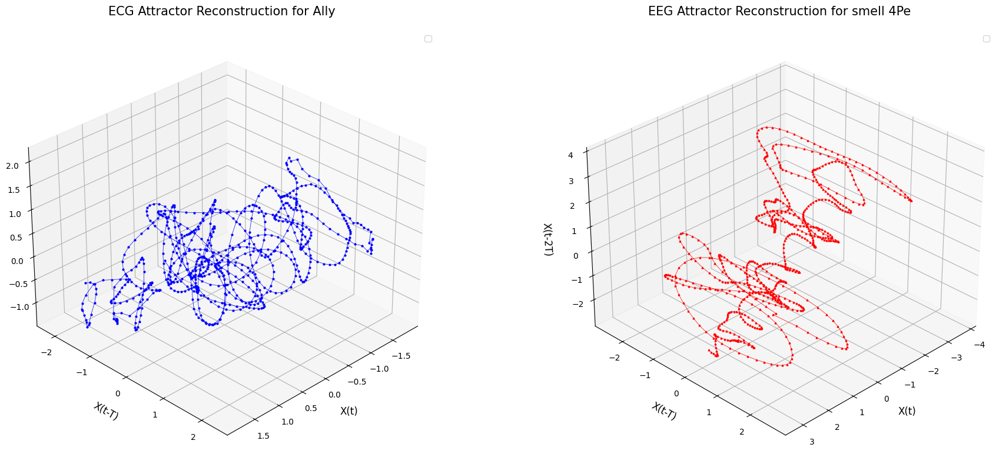

In [76]:
from gtda.time_series import SingleTakensEmbedding
from sklearn.manifold import MDS
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Sample signal data
s1 = erp_dict['Signal'][0, :]
s1 = s1[1100:1850]
s2 = erp_dict['Signal'][9, :]
s2 = s2[1100:1850]

# Takens embedding parameters

stride = 1

# Single Takens Embedding for s1
STE_s1 = SingleTakensEmbedding(
    parameters_type="search", n_jobs=-1, time_delay=10, dimension=5, stride=stride
)
y_1 = STE_s1.fit_transform(s1)

# Single Takens Embedding for s2
STE_s2 = SingleTakensEmbedding(
    parameters_type="search", n_jobs=-1, time_delay=10, dimension=5, stride=stride
)
y_2 = STE_s2.fit_transform(s2)

# Reduce dimensionality to 3 using MDS
mds = MDS(n_components=3, n_jobs=-1, random_state=0)
y_1_reduced = mds.fit_transform(y_1)
y_2_reduced = mds.fit_transform(y_2)

# Create subplots
fig = plt.figure(figsize=(20, 8))

# Plot the attractor for s1
ax1 = fig.add_subplot(121, projection='3d')
ax1.plot(y_1_reduced[:, 0], y_1_reduced[:, 1], y_1_reduced[:, 2], color='blue', marker='o', linestyle='-', linewidth=0.5, markersize=2)
ax1.set_xlabel('X(t)', fontsize=12, labelpad=10)
ax1.set_ylabel('X(t-T)', fontsize=12, labelpad=10)
ax1.set_zlabel('X(t-2T)', fontsize=12, labelpad=10)
ax1.set_title('ECG Attractor Reconstruction for Ally', fontsize=15, pad=20)
ax1.legend(loc='upper right', fontsize=10)
ax1.grid(True)
ax1.view_init(elev=30, azim=45)

# Plot the attractor for s2
ax2 = fig.add_subplot(122, projection='3d')
ax2.plot(y_2_reduced[:, 0], y_2_reduced[:, 1], y_2_reduced[:, 2], color='red', marker='^', linestyle='-', linewidth=0.5, markersize=2)
ax2.set_xlabel('X(t)', fontsize=12, labelpad=10)
ax2.set_ylabel('X(t-T)', fontsize=12, labelpad=10)
ax2.set_zlabel('X(t-2T)', fontsize=12, labelpad=10)
ax2.set_title('EEG Attractor Reconstruction for smell 4Pe', fontsize=15, pad=20)
ax2.legend(loc='upper right', fontsize=10)
ax2.grid(True)
ax2.view_init(elev=30, azim=45)

# Show the plot
plt.tight_layout()
plt.show()


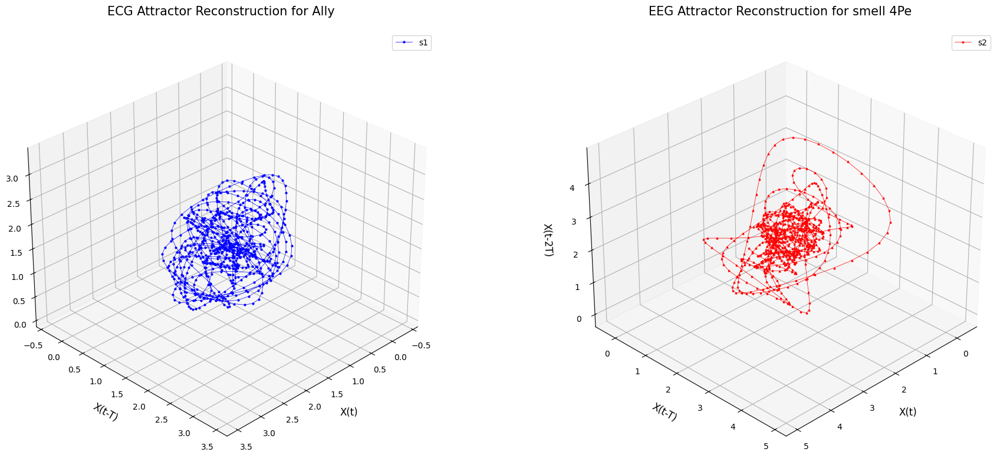

In [88]:
from gtda.time_series import TakensEmbedding
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Sample signal data
s1 = erp_dict['Signal'][0, 1100:1850]
s2 = erp_dict['Signal'][9, 1100:1850]

# Takens embedding parameters
embedding_dimension = 3
embedding_time_delay = 10
stride = 1

# Takens Embedding for s1
TE_s1 = TakensEmbedding(
    time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)
y_1 = TE_s1.fit_transform([s1])

# Takens Embedding for s2
TE_s2 = TakensEmbedding(
    time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)
y_2 = TE_s2.fit_transform([s2])

# Extract the embedded coordinates for plotting
y_1_embedded = y_1[0]
y_2_embedded = y_2[0]

# Create subplots
fig = plt.figure(figsize=(20, 8))

# Plot the attractor for s1
ax1 = fig.add_subplot(121, projection='3d')
ax1.plot(y_1_embedded[:, 0], y_1_embedded[:, 1], y_1_embedded[:, 2], color='blue', marker='o', linestyle='-', linewidth=0.5, markersize=2)
ax1.set_xlabel('X(t)', fontsize=12, labelpad=10)
ax1.set_ylabel('X(t-T)', fontsize=12, labelpad=10)
ax1.set_zlabel('X(t-2T)', fontsize=12, labelpad=10)
ax1.set_title('ECG Attractor Reconstruction for Ally', fontsize=15, pad=20)
ax1.legend(['s1'], loc='upper right', fontsize=10)
ax1.grid(True)
ax1.view_init(elev=30, azim=45)

# Plot the attractor for s2
ax2 = fig.add_subplot(122, projection='3d')
ax2.plot(y_2_embedded[:, 0], y_2_embedded[:, 1], y_2_embedded[:, 2], color='red', marker='^', linestyle='-', linewidth=0.5, markersize=2)
ax2.set_xlabel('X(t)', fontsize=12, labelpad=10)
ax2.set_ylabel('X(t-T)', fontsize=12, labelpad=10)
ax2.set_zlabel('X(t-2T)', fontsize=12, labelpad=10)
ax2.set_title('EEG Attractor Reconstruction for smell 4Pe', fontsize=15, pad=20)
ax2.legend(['s2'], loc='upper right', fontsize=10)
ax2.grid(True)
ax2.view_init(elev=30, azim=45)

# Show the plot
plt.tight_layout()
plt.show()


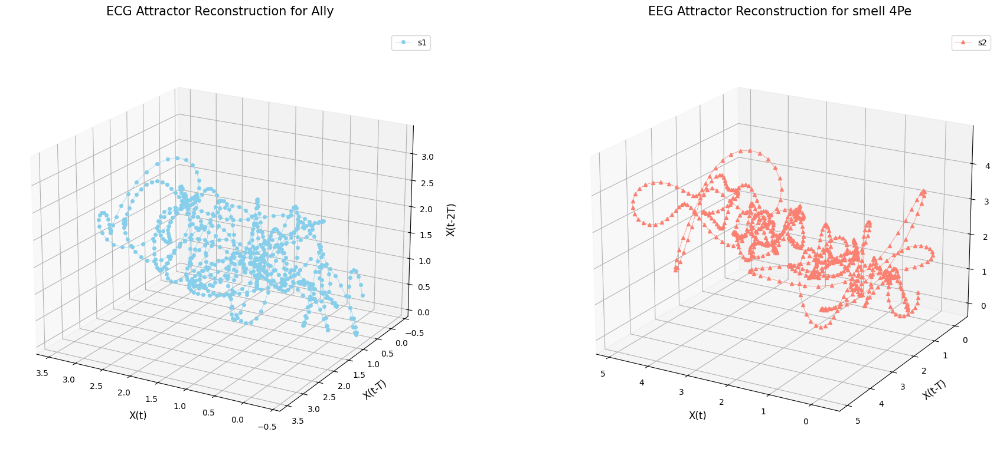

In [103]:
from gtda.time_series import TakensEmbedding
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Sample signal data
s1 = erp_dict['Signal'][0, 1100:1850]
s2 = erp_dict['Signal'][9, 1100:1850]

# Takens embedding parameters
embedding_dimension = 3
embedding_time_delay = 10
stride = 1

# Takens Embedding for s1
TE_s1 = TakensEmbedding(
    time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)
y_1 = TE_s1.fit_transform([s1])

# Takens Embedding for s2
TE_s2 = TakensEmbedding(
    time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)
y_2 = TE_s2.fit_transform([s2])

# Extract the embedded coordinates for plotting
y_1_embedded = y_1[0]
y_2_embedded = y_2[0]

# Create subplots
fig = plt.figure(figsize=(20, 8))

# Plot the attractor for s1
ax1 = fig.add_subplot(121, projection='3d')
ax1.plot(y_1_embedded[:, 0], y_1_embedded[:, 1], y_1_embedded[:, 2], color='skyblue', marker='o', linestyle='-', linewidth=0.5, markersize=4)
ax1.set_xlabel('X(t)', fontsize=12, labelpad=10)
ax1.set_ylabel('X(t-T)', fontsize=12, labelpad=10)
ax1.set_zlabel('X(t-2T)', fontsize=12, labelpad=10)
ax1.set_title('ECG Attractor Reconstruction for Ally', fontsize=15, pad=20)
ax1.legend(['s1'], loc='upper right', fontsize=10)
ax1.grid(True)
ax1.view_init(elev=20, azim=120)  # Adjust viewing angle

# Plot the attractor for s2
ax2 = fig.add_subplot(122, projection='3d')
ax2.plot(y_2_embedded[:, 0], y_2_embedded[:, 1], y_2_embedded[:, 2], color='salmon', marker='^', linestyle='-', linewidth=0.5, markersize=4)
ax2.set_xlabel('X(t)', fontsize=12, labelpad=10)
ax2.set_ylabel('X(t-T)', fontsize=12, labelpad=10)
ax2.set_zlabel('X(t-2T)', fontsize=12, labelpad=10)
ax2.set_title('EEG Attractor Reconstruction for smell 4Pe', fontsize=15, pad=20)
ax2.legend(['s2'], loc='upper right', fontsize=10)
ax2.grid(True)
ax2.view_init(elev=20, azim=120)  # Adjust viewing angle

# Show the plot
plt.tight_layout()
plt.show()


In [62]:
import mat73
import numpy as np

# Load the data
data_dict = mat73.loadmat('/Users/ritwikghosh/Downloads/ProcData/EEG/Signals/KM26_s02/erp_v1.mat')

# Extract relevant information
eeg_data = data_dict['erp']  # EEG data
log_data = data_dict['log']  # Log data

# Find unique smell ids
unique_smell_ids = np.unique(log_data[:, 1])

# Initialize a dictionary to store the ERP mean signal with corresponding smell id
erp_dict = {'Signal': [], 'Smell_ID': []}

# Specify the channel (assuming it's 30 as per the example)
channel_idx = 30

# Iterate over each unique smell id
for smell_id in unique_smell_ids:
    # Find indices of trials corresponding to the current smell_id
    trial_indices = np.where(log_data[:, 1] == smell_id)[0]
    
    # Initialize an array to store EEG signals for the current smell_id
    eeg_signals = np.zeros((eeg_data.shape[1],))
    
    # Iterate over each trial for the current smell_id
    for trial_idx in trial_indices:
        # Extract EEG signal for the specified channel and trial
        eeg_signal = eeg_data[channel_idx, :, trial_idx]
        
        # Add the EEG signal to the array
        eeg_signals += eeg_signal
    
    # Calculate the mean EEG signal for the current smell_id
    mean_eeg_signal = eeg_signals / len(trial_indices)
    
    # Add the mean EEG signal and corresponding smell_id to the dictionary
    erp_dict['Signal'].append(mean_eeg_signal)
    erp_dict['Smell_ID'].append(smell_id)

# Convert the lists in the dictionary to numpy arrays
erp_dict['Signal'] = np.array(erp_dict['Signal'])
erp_dict['Smell_ID'] = np.array(erp_dict['Smell_ID'])

# Print the ERP mean signal with corresponding smell_id for channel 30
print("ERP mean signal for channel 30 with corresponding smell_id:")
for i in range(len(erp_dict['Signal'])):
    print(f"Smell ID: {erp_dict['Smell_ID'][i]}, Signal: {erp_dict['Signal'][i]}")


ERP mean signal for channel 30 with corresponding smell_id:
Smell ID: 2.0, Signal: [ 2.73386542  2.6921857   2.636238   ... -0.15178404 -0.22036011
 -0.26889786]
Smell ID: 3.0, Signal: [-5.28321004 -5.28155518 -5.29270565 ... -0.77526437 -0.814866
 -0.8419433 ]
Smell ID: 6.0, Signal: [-0.61903975 -0.57239902 -0.52350796 ... -0.73534336 -0.67428409
 -0.63021529]
Smell ID: 7.0, Signal: [-4.81067265 -4.82136328 -4.82323757 ... -1.34409925 -1.43783095
 -1.49608078]
Smell ID: 9.0, Signal: [0.57262351 0.62840899 0.69948682 ... 0.96377477 0.95428413 0.95776226]
Smell ID: 10.0, Signal: [1.33770647 1.39851038 1.48270448 ... 3.53889813 3.48512611 3.44495044]
Smell ID: 16.0, Signal: [1.83642986 1.8911378  1.9663126  ... 1.0745128  1.10266668 1.12033415]
Smell ID: 17.0, Signal: [0.41963512 0.5112593  0.62109768 ... 3.17483267 3.15666242 3.1377094 ]
Smell ID: 21.0, Signal: [-2.31947473 -2.34324437 -2.37638077 ...  1.89622495  1.90266313
  1.89476507]
Smell ID: 22.0, Signal: [1.01450593 1.0129197  1

In [11]:
from gtda.time_series import TakensEmbedding
import plotly.graph_objs as go
import numpy as np

# Sample signal data
s1 = erp_dict['Signal'][0, 1100:1850]
s2 = erp_dict['Signal'][9, 1100:1850]

# Takens embedding parameters
embedding_dimension = 3
embedding_time_delay = 10
stride = 1

# Takens Embedding for s1
TE_s1 = TakensEmbedding(
    time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)
y_1 = TE_s1.fit_transform([s1])

# Takens Embedding for s2
TE_s2 = TakensEmbedding(
    time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)
y_2 = TE_s2.fit_transform([s2])

# Extract the embedded coordinates for plotting
y_1_embedded = y_1[0]
y_2_embedded = y_2[0]

# Calculate distances from the center of the attractor for shading
def calculate_distances(embedded_points):
    center = np.mean(embedded_points, axis=0)
    distances = np.linalg.norm(embedded_points - center, axis=1)
    return distances

# Calculate distances for s1 and s2
distances_s1 = calculate_distances(y_1_embedded)
distances_s2 = calculate_distances(y_2_embedded)

# Define a shading function
def get_color(distances):
    max_distance = np.max(distances)
    normalized_distances = distances / max_distance
    colors = np.ones_like(normalized_distances) - normalized_distances * 0.5
    return colors

# Get colors for s1 and s2
colors_s1 = get_color(distances_s1)
colors_s2 = get_color(distances_s2)

# Plot the attractor for s1
trace_s1 = go.Scatter3d(
    x=y_1_embedded[:, 0],
    y=y_1_embedded[:, 1],
    z=y_1_embedded[:, 2],
    mode='markers',
    marker=dict(
        size=2,
        color=colors_s1,
        colorscale='Blues',
        opacity=0.8
    ),
    name='s1'
)

# Plot the attractor for s2
trace_s2 = go.Scatter3d(
    x=y_2_embedded[:, 0],
    y=y_2_embedded[:, 1],
    z=y_2_embedded[:, 2],
    mode='markers',
    marker=dict(
        size=2,
        color=colors_s2,
        colorscale='Reds',
        opacity=0.8
    ),
    name='s2'
)

# Set layout for the first subplot
layout_s1 = go.Layout(
    scene=dict(
        xaxis=dict(title='X(t)', range=[-2.25, 2.25]),
        yaxis=dict(title='X(t-T)', range=[-2.25, 2.25]),
        zaxis=dict(title='X(t-2T)', range=[-2.25, 2.25]),
    ),
    margin=dict(l=0, r=0, b=0, t=0),
    title='EEG Attractor Reconstruction for Ally'
)

# Set layout for the second subplot
layout_s2 = go.Layout(
    scene=dict(
        xaxis=dict(title='X(t)', range=[-3.6, 3.6]),
        yaxis=dict(title='X(t-T)', range=[-3.6, 3.6]),
        zaxis=dict(title='X(t-2T)', range=[-3.6, 3.6]),
    ),
    margin=dict(l=0, r=0, b=0, t=0),
    title='EEG Attractor Reconstruction for smell 4Pe'
)

# Create first subplot
fig_s1 = go.Figure(data=[trace_s1], layout=layout_s1)

# Create second subplot
fig_s2 = go.Figure(data=[trace_s2], layout=layout_s2)

# Save the plots as HTML files
fig_s1.write_html("EEG_Attractor_Reconstruction_ALLY.html")
fig_s2.write_html("EEG_Attractor_Reconstruction_4PE.html")


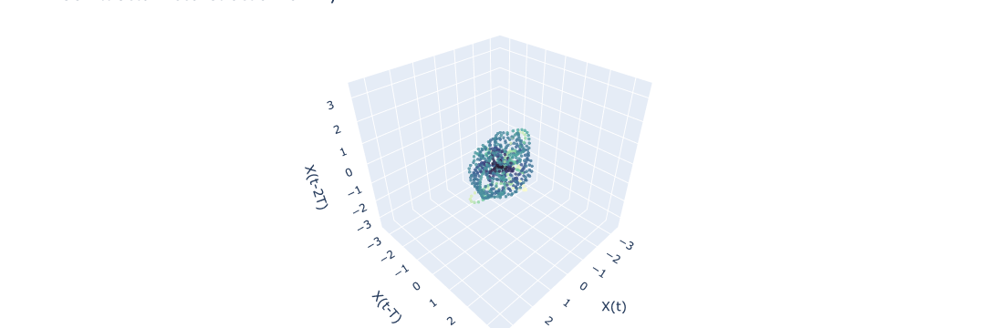

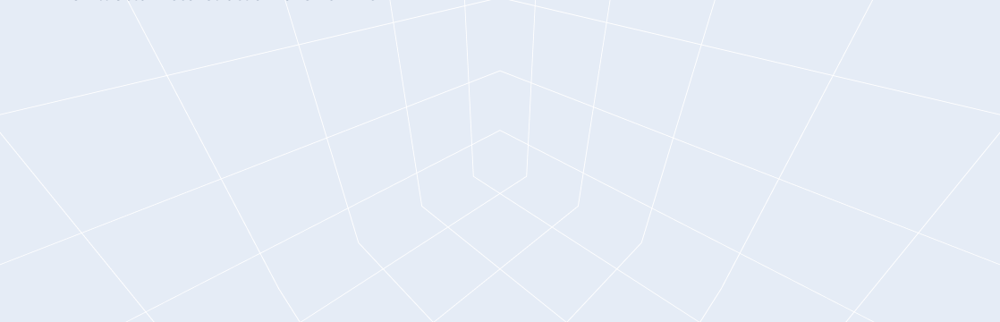

In [31]:
from gtda.time_series import TakensEmbedding
import plotly.graph_objs as go
import numpy as np

# Sample signal data
s1 = erp_dict['Signal'][0, 1100:1850]
s2 = erp_dict['Signal'][9, 1100:1850]

# Takens embedding parameters
embedding_dimension = 3
embedding_time_delay = 10
stride = 1

# Takens Embedding for s1
TE_s1 = TakensEmbedding(
    time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)
y_1 = TE_s1.fit_transform([s1])

# Takens Embedding for s2
TE_s2 = TakensEmbedding(
    time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)
y_2 = TE_s2.fit_transform([s2])

# Extract the embedded coordinates for plotting
y_1_embedded = y_1[0]
y_2_embedded = y_2[0]

# Calculate distances from the center of the attractor for shading
def calculate_distances(embedded_points):
    center = np.mean(embedded_points, axis=0)
    distances = np.linalg.norm(embedded_points - center, axis=1)
    return distances

# Calculate distances for s1 and s2
distances_s1 = calculate_distances(y_1_embedded)
distances_s2 = calculate_distances(y_2_embedded)

# Define a shading function
def get_color(distances):
    max_distance = np.max(distances)
    normalized_distances = distances / max_distance
    colors = np.ones_like(normalized_distances) - normalized_distances * 0.5
    return colors

# Get colors for s1 and s2
colors_s1 = get_color(distances_s1)
colors_s2 = get_color(distances_s2)

# Plot the attractor for s1
trace_s1 = go.Scatter3d(
    x=y_1_embedded[:, 0],
    y=y_1_embedded[:, 1],
    z=y_1_embedded[:, 2],
    mode='markers',
    marker=dict(
        size=2,
        color=colors_s1,
        colorscale='deep',
        opacity=0.8
    ),
    name='s1'
)

# Plot the attractor for s2
trace_s2 = go.Scatter3d(
    x=y_2_embedded[:, 0],
    y=y_2_embedded[:, 1],
    z=y_2_embedded[:, 2],
    mode='markers',
    marker=dict(
        size=2,
        color=colors_s2,
        colorscale='deep',
        opacity=0.8
    ),
    name='s2'
)

# Set layout for the first subplot
layout_s1 = go.Layout(
    scene=dict(
        xaxis=dict(title='X(t)', range=[-3.6, 3.6]),
        yaxis=dict(title='X(t-T)', range=[-3.6, 3.6]),
        zaxis=dict(title='X(t-2T)', range=[-3.6, 3.6]),
    ),
    margin=dict(l=0, r=0, b=0, t=0),
    title='ECG Attractor Reconstruction for Ally'
)

# Set layout for the second subplot
layout_s2 = go.Layout(
    scene=dict(
        xaxis=dict(title='X(t)', range=[-3.6, 3.6]),
        yaxis=dict(title='X(t-T)', range=[-3.6, 3.6]),
        zaxis=dict(title='X(t-2T)', range=[-3.6, 3.6]),
    ),
    margin=dict(l=0, r=0, b=0, t=0),
    title='EEG Attractor Reconstruction for smell 4Pe'
)

# Create first subplot
fig_s1 = go.Figure(data=[trace_s1], layout=layout_s1)

# Create second subplot
fig_s2 = go.Figure(data=[trace_s2], layout=layout_s2)

# Display subplots side by side
fig_s1.show()
fig_s2.show()


In [ ]:
['aggrnyl', 'agsunset', 'algae', 'amp', 'armyrose', 'balance',
             'blackbody', 'bluered', 'blues', 'blugrn', 'bluyl', 'brbg',
             'brwnyl', 'bugn', 'bupu', 'burg', 'burgyl', 'cividis', 'curl',
             'darkmint', 'deep', 'delta', 'dense', 'earth', 'edge', 'electric',
             'emrld', 'fall', 'geyser', 'gnbu', 'gray', 'greens', 'greys',
             'haline', 'hot', 'hsv', 'ice', 'icefire', 'inferno', 'jet',
             'magenta', 'magma', 'matter', 'mint', 'mrybm', 'mygbm', 'oranges',
             'orrd', 'oryel', 'oxy', 'peach', 'phase', 'picnic', 'pinkyl',
             'piyg', 'plasma', 'plotly3', 'portland', 'prgn', 'pubu', 'pubugn',
             'puor', 'purd', 'purp', 'purples', 'purpor', 'rainbow', 'rdbu',
             'rdgy', 'rdpu', 'rdylbu', 'rdylgn', 'redor', 'reds', 'solar',
             'spectral', 'speed', 'sunset', 'sunsetdark', 'teal', 'tealgrn',
             'tealrose', 'tempo', 'temps', 'thermal', 'tropic', 'turbid',
             'turbo', 'twilight', 'viridis', 'ylgn', 'ylgnbu', 'ylorbr',
             'ylorrd']

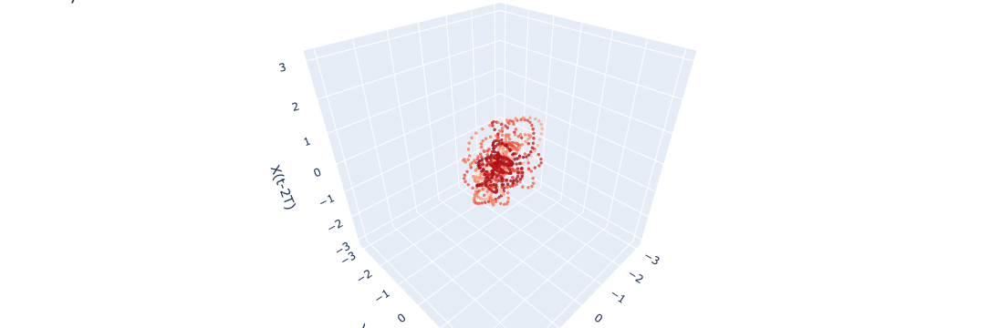

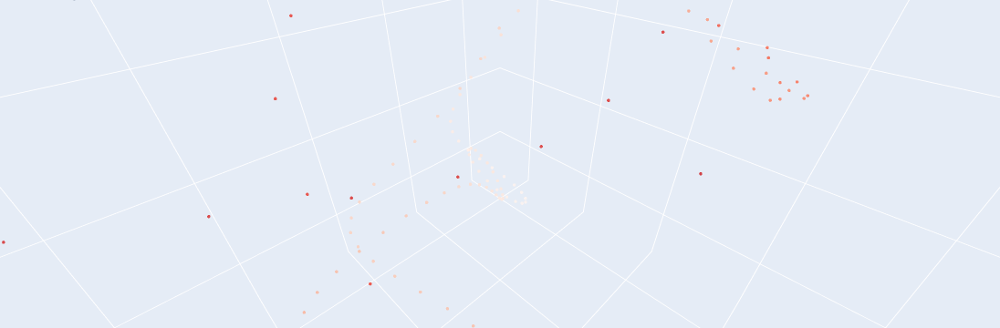

In [7]:
import plotly.graph_objs as go
import numpy as np
from gtda.time_series import TakensEmbedding

# Sample signal data (assuming erp_dict is defined elsewhere)
s1 = erp_dict['Signal'][0, 1100:1850]
s2 = erp_dict['Signal'][9, 1100:1850]

# Takens embedding parameters
embedding_dimension = 3
embedding_time_delay = 10
stride = 1

# Takens Embedding for s1
TE_s1 = TakensEmbedding(
    time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)
y_1 = TE_s1.fit_transform([s1])

# Takens Embedding for s2
TE_s2 = TakensEmbedding(
    time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)
y_2 = TE_s2.fit_transform([s2])

# Extract the embedded coordinates for plotting
y_1_embedded = y_1[0]
y_2_embedded = y_2[0]

# Calculate distances from the center of the attractor for shading
def calculate_distances(embedded_points):
    center = np.mean(embedded_points, axis=0)
    distances = np.linalg.norm(embedded_points - center, axis=1)
    return distances

# Calculate distances for s1 and s2
distances_s1 = calculate_distances(y_1_embedded)
distances_s2 = calculate_distances(y_2_embedded)

# Define a shading function
def get_color(distances):
    max_distance = np.max(distances)
    normalized_distances = distances / max_distance
    colors = np.ones_like(normalized_distances) - normalized_distances * 0.5
    return colors

# Get colors for s1 and s2
colors_s1 = get_color(distances_s1)
colors_s2 = get_color(distances_s2)

# Plot the attractor for s1
trace_s1 = go.Scatter3d(
    x=y_1_embedded[:, 0],
    y=y_1_embedded[:, 1],
    z=y_1_embedded[:, 2],
    mode='markers',
    marker=dict(
        size=2,
        color=colors_s1,
        colorscale='Reds',
        opacity=0.8
    ),
    name='s1'
)

# Plot the attractor for s2
trace_s2 = go.Scatter3d(
    x=y_2_embedded[:, 0],
    y=y_2_embedded[:, 1],
    z=y_2_embedded[:, 2],
    mode='markers',
    marker=dict(
        size=2,
        color=colors_s2,
        colorscale='Reds',
        opacity=0.8
    ),
    name='s2'
)

# Set layout for the first subplot
layout_s1 = go.Layout(
    scene=dict(
        xaxis=dict(title='X(t)', range=[-3.25, 3.25]),
        yaxis=dict(title='X(t-T)', range=[-3.25, 3.25]),
        zaxis=dict(title='X(t-2T)', range=[-3.25, 3.25]),
    ),
    margin=dict(l=0, r=0, b=0, t=0),
    title='Ally'
)

# Set layout for the second subplot
layout_s2 = go.Layout(
    scene=dict(
        xaxis=dict(title='X(t)', range=[-3.6, 3.6]),
        yaxis=dict(title='X(t-T)', range=[-3.6, 3.6]),
        zaxis=dict(title='X(t-2T)', range=[-3.6, 3.6]),
    ),
    margin=dict(l=0, r=0, b=0, t=0),
    title='4Pe'
)

# Create first subplot
fig_s1 = go.Figure(data=[trace_s1], layout=layout_s1)

# Create second subplot
fig_s2 = go.Figure(data=[trace_s2], layout=layout_s2)

fig_s1.show()
fig_s2.show()

In [67]:
import mat73
import numpy as np

# Load the data
data_dict = mat73.loadmat('/Users/ritwikghosh/Downloads/ProcData/EEG/Signals/KM26_s01/erp_v1.mat')

# Extract relevant information
eeg_data = data_dict['erp']  # EEG data
log_data = data_dict['log']  # Log data

# Find unique smell ids
unique_smell_ids = np.unique(log_data[:, 1])

# Initialize a dictionary to store the ERP mean signal with corresponding smell id
erp_dict = {'Signal': [], 'Smell_ID': []}

# Specify the channel (assuming it's 30 as per the example)
channel_idx = 30

# Iterate over each unique smell id
for smell_id in unique_smell_ids:
    # Find indices of trials corresponding to the current smell_id
    trial_indices = np.where(log_data[:, 1] == smell_id)[0]
    
    # Initialize an array to store EEG signals for the current smell_id
    eeg_signals = np.zeros((eeg_data.shape[1],))
    
    # Iterate over each trial for the current smell_id
    for trial_idx in trial_indices:
        # Extract EEG signal for the specified channel and trial
        eeg_signal = eeg_data[channel_idx, :, trial_idx]
        
        # Add the EEG signal to the array
        eeg_signals += eeg_signal
    
    # Calculate the mean EEG signal for the current smell_id
    mean_eeg_signal = eeg_signals / len(trial_indices)
    
    # Add the mean EEG signal and corresponding smell_id to the dictionary
    erp_dict['Signal'].append(mean_eeg_signal)
    erp_dict['Smell_ID'].append(smell_id)

# Convert the lists in the dictionary to numpy arrays
erp_dict['Signal'] = np.array(erp_dict['Signal'])
erp_dict['Smell_ID'] = np.array(erp_dict['Smell_ID'])

# Print the ERP mean signal with corresponding smell_id for channel 30
print("ERP mean signal for channel 30 with corresponding smell_id:")
for i in range(len(erp_dict['Signal'])):
    print(f"Smell ID: {erp_dict['Smell_ID'][i]}, Signal: {erp_dict['Signal'][i]}")


ERP mean signal for channel 30 with corresponding smell_id:
Smell ID: 2.0, Signal: [1.12144901 1.19459306 1.29560034 ... 0.20675713 0.17649919 0.14974241]
Smell ID: 3.0, Signal: [-4.25700493 -4.12007126 -3.94806906 ...  1.45093872  1.45966399
  1.44972077]
Smell ID: 6.0, Signal: [-2.72938059 -2.72028263 -2.72795347 ... -0.67884833 -0.54940151
 -0.44670417]
Smell ID: 7.0, Signal: [-3.4661211  -3.46133277 -3.48312886 ...  0.33219434  0.30865466
  0.28507501]
Smell ID: 9.0, Signal: [0.36183866 0.36652509 0.37384033 ... 0.77460033 0.7864717  0.79831906]
Smell ID: 10.0, Signal: [-2.47105736 -2.48933966 -2.49256498 ...  0.08670594  0.1461812
  0.18314885]
Smell ID: 16.0, Signal: [-0.37058897 -0.43533776 -0.51405329 ... -2.58827309 -2.70403053
 -2.76803732]
Smell ID: 17.0, Signal: [0.24010855 0.29999997 0.36985124 ... 3.46947611 3.43026357 3.39085706]
Smell ID: 21.0, Signal: [-1.99629632 -1.98625698 -1.98357706 ...  0.22758133  0.25107207
  0.2571913 ]
Smell ID: 22.0, Signal: [0.2880162  0.26

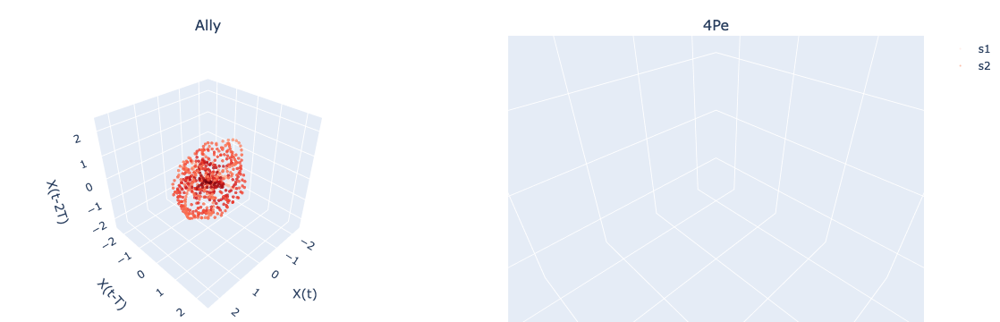

In [69]:
import plotly.graph_objs as go
import plotly.subplots as sp
import numpy as np
from gtda.time_series import TakensEmbedding

# Sample signal data (assuming erp_dict is defined elsewhere)
s1 = erp_dict['Signal'][0, 1100:1850]
s2 = erp_dict['Signal'][9, 1100:1850]

# Takens embedding parameters
embedding_dimension = 3
embedding_time_delay = 10
stride = 1

# Takens Embedding for s1
TE_s1 = TakensEmbedding(
    time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)
y_1 = TE_s1.fit_transform([s1])

# Takens Embedding for s2
TE_s2 = TakensEmbedding(
    time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)
y_2 = TE_s2.fit_transform([s2])

# Extract the embedded coordinates for plotting
y_1_embedded = y_1[0]
y_2_embedded = y_2[0]

# Calculate distances from the center of the attractor for shading
def calculate_distances(embedded_points):
    center = np.mean(embedded_points, axis=0)
    distances = np.linalg.norm(embedded_points - center, axis=1)
    return distances

# Calculate distances for s1 and s2
distances_s1 = calculate_distances(y_1_embedded)
distances_s2 = calculate_distances(y_2_embedded)

# Define a shading function
def get_color(distances):
    max_distance = np.max(distances)
    normalized_distances = distances / max_distance
    colors = np.ones_like(normalized_distances) - normalized_distances * 0.5
    return colors

# Get colors for s1 and s2
colors_s1 = get_color(distances_s1)
colors_s2 = get_color(distances_s2)

# Plot the attractor for s1
trace_s1 = go.Scatter3d(
    x=y_1_embedded[:, 0],
    y=y_1_embedded[:, 1],
    z=y_1_embedded[:, 2],
    mode='markers',
    marker=dict(
        size=2,
        color=colors_s1,
        colorscale='Reds',
        opacity=0.8
    ),
    name='s1'
)

# Plot the attractor for s2
trace_s2 = go.Scatter3d(
    x=y_2_embedded[:, 0],
    y=y_2_embedded[:, 1],
    z=y_2_embedded[:, 2],
    mode='markers',
    marker=dict(
        size=2,
        color=colors_s2,
        colorscale='Reds',
        opacity=0.8
    ),
    name='s2'
)

# Create subplots
fig = sp.make_subplots(
    rows=1, cols=2,
    specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]],
    subplot_titles=("Ally", "4Pe")
)

# Add traces to the subplots
fig.add_trace(trace_s1, row=1, col=1)
fig.add_trace(trace_s2, row=1, col=2)

# Update layout for the entire figure
fig.update_layout(
    scene=dict(
        xaxis=dict(title='X(t)', range=[-2.5, 2.5]),
        yaxis=dict(title='X(t-T)', range=[-2.5, 2.5]),
        zaxis=dict(title='X(t-2T)', range=[-2.5, 2.5]),
    ),
    scene2=dict(
        xaxis=dict(title='X(t)', range=[-3.5, 3.5]),
        yaxis=dict(title='X(t-T)', range=[-3.5, 3.5]),
        zaxis=dict(title='X(t-2T)', range=[-3.5, 3.5]),
    ),
    margin=dict(l=0, r=0, b=0, t=40)
)

fig.show()


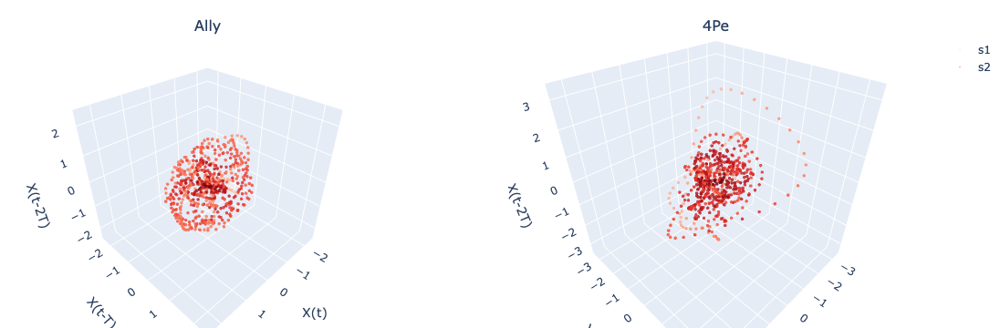

In [72]:
import plotly.graph_objs as go
import plotly.io as pio
import numpy as np
from gtda.time_series import TakensEmbedding

# Sample signal data (assuming erp_dict is defined elsewhere)
s1 = erp_dict['Signal'][0, 1100:1850]
s2 = erp_dict['Signal'][9, 1100:1850]

# Takens embedding parameters
embedding_dimension = 3
embedding_time_delay = 10
stride = 1

# Takens Embedding for s1
TE_s1 = TakensEmbedding(
    time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)
y_1 = TE_s1.fit_transform([s1])

# Takens Embedding for s2
TE_s2 = TakensEmbedding(
    time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)
y_2 = TE_s2.fit_transform([s2])

# Extract the embedded coordinates for plotting
y_1_embedded = y_1[0]
y_2_embedded = y_2[0]

# Calculate distances from the center of the attractor for shading
def calculate_distances(embedded_points):
    center = np.mean(embedded_points, axis=0)
    distances = np.linalg.norm(embedded_points - center, axis=1)
    return distances

# Calculate distances for s1 and s2
distances_s1 = calculate_distances(y_1_embedded)
distances_s2 = calculate_distances(y_2_embedded)

# Define a shading function
def get_color(distances):
    max_distance = np.max(distances)
    normalized_distances = distances / max_distance
    colors = np.ones_like(normalized_distances) - normalized_distances * 0.5
    return colors

# Get colors for s1 and s2
colors_s1 = get_color(distances_s1)
colors_s2 = get_color(distances_s2)

# Plot the attractor for s1
trace_s1 = go.Scatter3d(
    x=y_1_embedded[:, 0],
    y=y_1_embedded[:, 1],
    z=y_1_embedded[:, 2],
    mode='markers',
    marker=dict(
        size=2,
        color=colors_s1,
        colorscale='Reds',
        opacity=0.8
    ),
    name='s1'
)

# Plot the attractor for s2
trace_s2 = go.Scatter3d(
    x=y_2_embedded[:, 0],
    y=y_2_embedded[:, 1],
    z=y_2_embedded[:, 2],
    mode='markers',
    marker=dict(
        size=2,
        color=colors_s2,
        colorscale='Reds',
        opacity=0.8
    ),
    name='s2'
)

# Create subplots
fig = sp.make_subplots(
    rows=1, cols=2,
    specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]],
    subplot_titles=("Ally", "4Pe")
)

# Add traces to the subplots
fig.add_trace(trace_s1, row=1, col=1)
fig.add_trace(trace_s2, row=1, col=2)

# Update layout for the entire figure
fig.update_layout(
    scene=dict(
        xaxis=dict(title='X(t)', range=[-2.5, 2.5]),
        yaxis=dict(title='X(t-T)', range=[-2.5, 2.5]),
        zaxis=dict(title='X(t-2T)', range=[-2.5, 2.5]),
    ),
    scene2=dict(
        xaxis=dict(title='X(t)', range=[-3.5, 3.5]),
        yaxis=dict(title='X(t-T)', range=[-3.5, 3.5]),
        zaxis=dict(title='X(t-2T)', range=[-3.5, 3.5]),
    ),
    margin=dict(l=0, r=0, b=0, t=40)
)

# Save the subplot figure as a PDF
pio.write_image(fig, '/Users/ritwikghosh/Downloads/Features Df/attractors_subplot.pdf')

# Show the original subplot figure
fig.show()


In [155]:
filename = "/Users/ritwikghosh/Downloads/PDF images of Research Paper/plot.pdf"

# Write the figure to a PDF file
fig.write_image('Point Cloud Diagram', format='pdf')  # Specify format as 'pdf'

print(f"Plot saved as PDF: {filename}")

ValueError: 
Image export using the "kaleido" engine requires the kaleido package,
which can be installed using pip:
    $ pip install -U kaleido


In [153]:
import plotly.graph_objs as go
import plotly.subplots as sp
import numpy as np
import plotly.io as pio
import os
from gtda.time_series import TakensEmbedding
import matplotlib.pyplot as plt
from PIL import Image
import io

# Sample signal data (assuming erp_dict is defined elsewhere)
s1 = erp_dict['Signal'][0, 1100:1850]
s2 = erp_dict['Signal'][9, 1100:1850]

# Takens embedding parameters
embedding_dimension = 3
embedding_time_delay = 10
stride = 1

# Takens Embedding for s1
TE_s1 = TakensEmbedding(
    time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)
y_1 = TE_s1.fit_transform([s1])

# Takens Embedding for s2
TE_s2 = TakensEmbedding(
    time_delay=embedding_time_delay, dimension=embedding_dimension, stride=stride
)
y_2 = TE_s2.fit_transform([s2])

# Extract the embedded coordinates for plotting
y_1_embedded = y_1[0]
y_2_embedded = y_2[0]

# Calculate distances from the center of the attractor for shading
def calculate_distances(embedded_points):
    center = np.mean(embedded_points, axis=0)
    distances = np.linalg.norm(embedded_points - center, axis=1)
    return distances

# Calculate distances for s1 and s2
distances_s1 = calculate_distances(y_1_embedded)
distances_s2 = calculate_distances(y_2_embedded)

# Define a shading function
def get_color(distances):
    max_distance = np.max(distances)
    normalized_distances = distances / max_distance
    colors = np.ones_like(normalized_distances) - normalized_distances * 0.5
    return colors

# Get colors for s1 and s2
colors_s1 = get_color(distances_s1)
colors_s2 = get_color(distances_s2)

# Plot the attractor for s1
trace_s1 = go.Scatter3d(
    x=y_1_embedded[:, 0],
    y=y_1_embedded[:, 1],
    z=y_1_embedded[:, 2],
    mode='markers',
    marker=dict(
        size=2,
        color=colors_s1,
        colorscale='Reds',
        opacity=0.8
    ),
    name='s1'
)

# Plot the attractor for s2
trace_s2 = go.Scatter3d(
    x=y_2_embedded[:, 0],
    y=y_2_embedded[:, 1],
    z=y_2_embedded[:, 2],
    mode='markers',
    marker=dict(
        size=2,
        color=colors_s2,
        colorscale='Reds',
        opacity=0.8
    ),
    name='s2'
)

# Create subplots
fig = sp.make_subplots(
    rows=1, cols=2,
    specs=[[{'type': 'scatter3d'}, {'type': 'scatter3d'}]],
    subplot_titles=("Ally", "4Pe")
)

# Add traces to the subplots
fig.add_trace(trace_s1, row=1, col=1)
fig.add_trace(trace_s2, row=1, col=2)

# Update layout for the entire figure
fig.update_layout(
    scene=dict(
        xaxis=dict(title='X(t)', range=[-2.25, 2.25]),
        yaxis=dict(title='X(t-T)', range=[-2.25, 2.25]),
        zaxis=dict(title='X(t-2T)', range=[-2.25, 2.25]),
    ),
    scene2=dict(
        xaxis=dict(title='X(t)', range=[-3.6, 3.6]),
        yaxis=dict(title='X(t-T)', range=[-3.6, 3.6]),
        zaxis=dict(title='X(t-2T)', range=[-3.6, 3.6]),
    ),
    title='Takens Embedding of Signals',
    margin=dict(l=0, r=0, b=0, t=40)
)

# Directory and file path
directory = '/Users/ritwikghosh/Downloads/PDF images of Research Paper'
save_loc = os.path.join(directory, 'rf_arousal_triple.pdf')

# Render the plotly figure to an image
img_bytes = pio.to_image(fig, format='png')

# Convert the image bytes to a PIL Image
img = Image.open(io.BytesIO(img_bytes))

# Create a Matplotlib figure and save it
plt.figure(figsize=(12, 6))
plt.imshow(img)
plt.axis('off')  # Hide the axes

# Save the figure as a PDF
plt.savefig(save_loc, format='pdf', dpi=150, bbox_inches='tight')

print(f"Plot saved as PDF in: {save_loc}")


ValueError: 
Image export using the "kaleido" engine requires the kaleido package,
which can be installed using pip:
    $ pip install -U kaleido


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


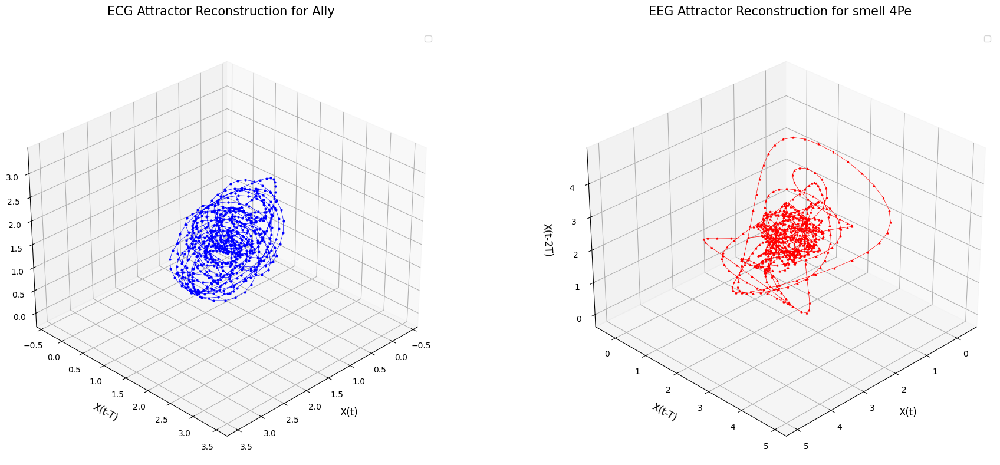

In [80]:
from gtda.time_series import SingleTakensEmbedding
from sklearn.manifold import MDS
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Sample signal data
s1 = erp_dict['Signal'][0, :]
s1 = s1[1100:1850]
s2 = erp_dict['Signal'][9, :]
s2 = s2[1100:1850]

# Takens embedding parameters

stride = 1

# Single Takens Embedding for s1
STE_s1 = SingleTakensEmbedding(
    parameters_type="search", n_jobs=-1, time_delay=10, dimension=3, stride=stride
)
y_1 = STE_s1.fit_transform(s1)

# Single Takens Embedding for s2
STE_s2 = SingleTakensEmbedding(
    parameters_type="search", n_jobs=-1, time_delay=10, dimension=5, stride=stride
)
y_2 = STE_s2.fit_transform(s2)

# Reduce dimensionality to 3 using MDS
# mds = MDS(n_components=3, n_jobs=-1, random_state=0)
# y_1_reduced = mds.fit_transform(y_1)
# y_2_reduced = mds.fit_transform(y_2)

# Create subplots
fig = plt.figure(figsize=(20, 8))

# Plot the attractor for s1
ax1 = fig.add_subplot(121, projection='3d')
ax1.plot(y_1[:, 0], y_1[:, 1], y_1[:, 2], color='blue', marker='o', linestyle='-', linewidth=0.5, markersize=2)
ax1.set_xlabel('X(t)', fontsize=12, labelpad=10)
ax1.set_ylabel('X(t-T)', fontsize=12, labelpad=10)
ax1.set_zlabel('X(t-2T)', fontsize=12, labelpad=10)
ax1.set_title('ECG Attractor Reconstruction for Ally', fontsize=15, pad=20)
ax1.legend(loc='upper right', fontsize=10)
ax1.grid(True)
ax1.view_init(elev=30, azim=45)

# Plot the attractor for s2
ax2 = fig.add_subplot(122, projection='3d')
ax2.plot(y_2[:, 0], y_2[:, 1], y_2[:, 2], color='red', marker='^', linestyle='-', linewidth=0.5, markersize=2)
ax2.set_xlabel('X(t)', fontsize=12, labelpad=10)
ax2.set_ylabel('X(t-T)', fontsize=12, labelpad=10)
ax2.set_zlabel('X(t-2T)', fontsize=12, labelpad=10)
ax2.set_title('EEG Attractor Reconstruction for smell 4Pe', fontsize=15, pad=20)
ax2.legend(loc='upper right', fontsize=10)
ax2.grid(True)
ax2.view_init(elev=30, azim=45)

# Show the plot
plt.tight_layout()
plt.show()


In [58]:
y_2.shap

(690, 2)

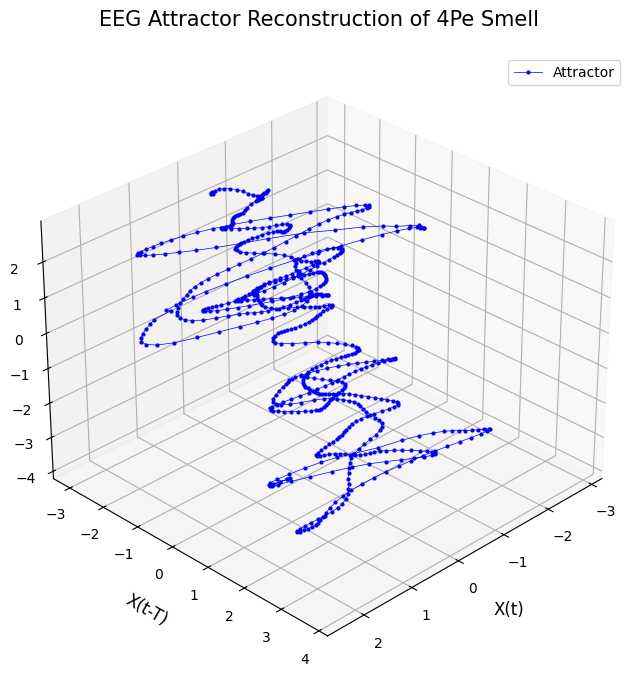

In [47]:
from gtda.time_series import SingleTakensEmbedding
from sklearn.manifold import MDS
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Sample signal data
s2 = erp_dict['Signal'][9, :]
s2 = s2[1100:1800]

# Takens embedding parameters

stride = 1

# Single Takens Embedding
STE = SingleTakensEmbedding(
    parameters_type="search", n_jobs=-1, time_delay=10, dimension=5, stride=stride
)
y_2 = STE.fit_transform(s2)

# Reduce dimensionality to 3 using MDS
mds = MDS(n_components=3, n_jobs=-1)
y_2_reduced = mds.fit_transform(y_2)

# Plot the attractor in 3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot the attractor with enhanced visualization
ax.plot(y_2_reduced[:, 0], y_2_reduced[:, 1], y_2_reduced[:, 2], color='blue', marker='o', linestyle='-', linewidth=0.5, markersize=2, label='Attractor')

# Set labels and title
ax.set_xlabel('X(t)', fontsize=12, labelpad=10)
ax.set_ylabel('X(t-T)', fontsize=12, labelpad=10)
ax.set_zlabel('X(t-2T)', fontsize=12, labelpad=10)
ax.set_title('EEG Attractor Reconstruction of 4Pe Smell', fontsize=15, pad=20)

# Add legend
ax.legend(loc='upper right', fontsize=10)

# Add grid lines
ax.grid(True)

# Customize the view angle for better visualization
ax.view_init(elev=30, azim=45)

# Show the plot
plt.show()


In [45]:
y_2.shape

(660, 5)

In [15]:
diagram_2.shape

(1, 795, 3)

In [13]:
diagram_1.shape

(1, 956, 3)

In [962]:
from gtda.time_series import TakensEmbedding,SingleTakensEmbedding
from gtda.time_series import Resampler, SlidingWindow, takens_embedding_optimal_parameters, \
    TakensEmbedding, PermutationEntropy, SingleTakensEmbedding

from gtda.plotting import plot_point_cloud

homology_dimensions = [0,1,2]
embedding_dimension = 20
embedding_time_delay = 20
stride = 1
STE = SingleTakensEmbedding(
    parameters_type="search", n_jobs=-1, time_delay=10, dimension=5, stride=stride
)

y_21 = STE.fit_transform(erp_dict['Signal'][1][1100:1800])


In [963]:
from gtda.homology import VietorisRipsPersistence
from gtda.homology import WeakAlphaPersistence, VietorisRipsPersistence
from gtda.diagrams import Scaler, Filtering, PersistenceEntropy, BettiCurve, PairwiseDistance
from gtda.time_series import PermutationEntropy


# 0 - connected components, 1 - loops, 2 - voids
homology_dimensions = [0, 1, 2]

# Collapse edges to speed up H2 persistence calculation!
VR = VietorisRipsPersistence(
    metric="euclidean",
    homology_dimensions=homology_dimensions,
    n_jobs=-1,
    collapse_edges=True,
)
#persistence = VietorisRipsPersistence(homology_dimensions=[0, 1], n_jobs=-1)
scaling = Scaler()
entropy = PersistenceEntropy(normalize=True, nan_fill_value=-99999999)

diagram_21 = VR.fit_transform([y_21])

In [964]:
diagram_21.shape

(1, 938, 3)

In [965]:
Bc= BettiCurve(n_bins=300)
X_21= Bc.fit_transform(diagram_21)

In [966]:
X_21=X_21[0].T

In [967]:
Y_21= np.array([21]*300)

In [968]:
Y_21.shape

(300,)

In [969]:
y_10 = STE.fit_transform(erp_dict['Signal'][8][1100:1800])
diagram_10 = VR.fit_transform([y_10])
Bc= BettiCurve(n_bins=300)
X_10= Bc.fit_transform(diagram_10)
X_10=X_10[0].T
Y_10= np.array([10]*300)

In [159]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
import numpy as np

# Assuming X_10, X_21, Y_10, and Y_21 are already defined matrices and vectors

# Concatenate X_10 and X_21 along axis 0
X_concatenated = np.concatenate((X_10, X_21), axis=0)

# Concatenate Y_10 and Y_21
Y_concatenated = np.concatenate((Y_10, Y_21))

# Split data into train and test sets
X_train, X_test, Y_train, Y_test = train_test_split(X_concatenated, Y_concatenated, test_size=0.2, random_state=0)

# Initialize SVM classifier
svm_classifier = SVC()

# Train the SVM model
svm_classifier.fit(X_train, Y_train)

# Evaluate the model
accuracy = svm_classifier.score(X_test, Y_test)
print("Accuracy on test set:", accuracy)


Accuracy on test set: 0.475


In [155]:
X_concatenated.shape

(600, 3)

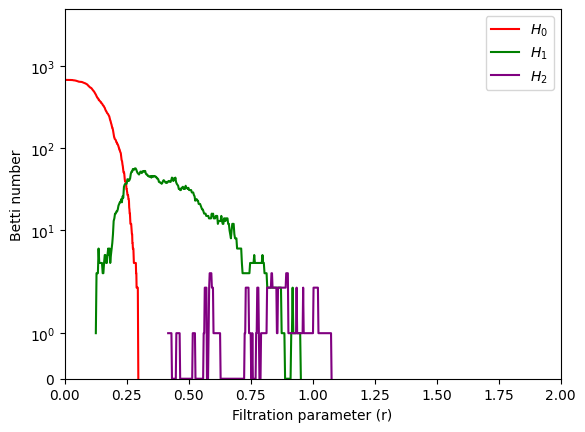

In [981]:
import matplotlib.pyplot as plt
#from your_library import BettiCurve  # Import BettiCurve from the appropriate module

def plot_betti_curve(diagrams):
    """Plot the Betti curve for the given diagrams."""
    # Create an instance of BettiCurve
    BC = BettiCurve(n_bins=300)
    
    # Fit and transform the diagrams using BettiCurve
    bcs = BC.fit_transform(diagrams)
    
    # Get the samplings
    X = BC.samplings_
    
    # Plot the Betti curve for each dimension
    Y0 = bcs[0][0]  # H0
    Y1 = bcs[0][1]  # H1
    Y2 = bcs[0][2]  # H2
    
    # Plot the Betti curves
    plt.plot(X[0], Y0, color='red', label=r'$H_0$')
    plt.plot(X[1], Y1, color='green', label=r'$H_1$')
    plt.plot(X[2], Y2, color='purple', label=r'$H_2$')
    
    # Set plot scale, labels, and limits
    plt.yscale('symlog')
    plt.ylabel("Betti number")
    plt.xlabel("Filtration parameter (r)")
    plt.xlim([0, 2])
    plt.ylim([0, 5000])
    plt.legend()
    
    # Show the plot
    plt.show()

# Example usage:
# Replace 'diagrams' with your data
#diagrams = your_diagrams_data

# Call the function to plot the Betti curve
plot_betti_curve(diagram_21)

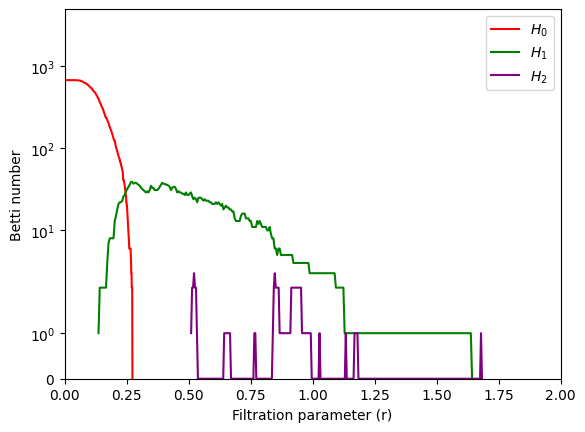

None


In [983]:
print(plot_betti_curve(diagram_10))

ValueError: x and y must have same first dimension, but have shapes (1,) and (300,)

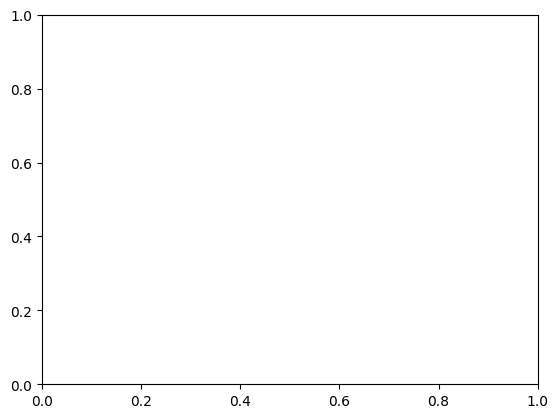

In [979]:
import matplotlib.pyplot as plt

def plot_betti_curve(diagrams):
    """Plot the Betti curve for the given diagrams."""
    # Create an instance of BettiCurve
    BC = BettiCurve(n_bins=300)
    
    # Fit and transform the diagrams using BettiCurve
    bcs = BC.fit_transform(diagrams)
    
    # Get the samplings
    X = BC.samplings_
    #print(X[2][-1])
    
    # Normalize X by dividing it by the last value of X
    X_norm = [x / X[2][-1] for x in X]
    
    # Plot the Betti curve for each dimension
    Y0 = bcs[0][0]  # H0
    Y1 = bcs[0][1]  # H1
    Y2 = bcs[0][2]  # H2
    
    # Plot the Betti curves
    plt.plot(X_norm[0], Y0, color='red', label=r'$H_0$')
    plt.plot(X_norm[1], Y1, color='green', label=r'$H_1$')
    plt.plot(X_norm[2], Y2, color='purple', label=r'$H_2$')
    
    # Set plot scale, labels, and limits
    plt.yscale('symlog')
    plt.ylabel("Betti number")
    plt.xlabel("Normalized Filtration parameter (r)")
    plt.xlim([0, 2])
    plt.ylim([0, 5000])
    plt.legend()
    
    # Show the plot
    plt.show()
plot_betti_curve(diagram_21)

In [827]:
import os
import mat73
import numpy as np
import pickle

# Define the channels and their corresponding names
channel_names = {37: 'Fz', 30: 'Pz', 47: 'Cz', 12: 'C3', 49: 'C4', 14: 'T7', 51: 'T8'}
channels = [37, 30, 47, 12, 49, 14, 51]

# Define the path to the directory containing all subject data
data_directory = '/Users/ritwikghosh/Downloads/ProcData/EEG/Signals'

# Initialize a list to store dictionaries for each subject
all_subject_data = []

# Iterate over each subject directory
for subject_folder in os.listdir(data_directory):
    subject_folder_path = os.path.join(data_directory, subject_folder)
    if not os.path.isdir(subject_folder_path):
        continue  # Skip non-directory items
    
    subject_data_path = os.path.join(subject_folder_path, 'erp_v1.mat')
    
    # Load the data for the current subject
    try:
        data_dict = mat73.loadmat(subject_data_path)
    except NotImplementedError:
        # Skip non-MATLAB v7.3 files
        continue
    
    # Extract relevant information
    eeg_data = data_dict['erp']  # EEG data
    log_data = data_dict['log']  # Log data
    
    # Find unique smell ids
    unique_smell_ids = np.unique(log_data[:, 1])
    
    # Initialize a dictionary to store the ERP mean signal with corresponding smell id for the current subject
    subject_dict = {'Subject': subject_folder, 'Channel': [], 'Signal': [], 'Smell_ID': []}
    
    # Iterate over each channel
    for channel_idx in channels:
        # Iterate over each unique smell id
        for smell_id in unique_smell_ids:
            # Find indices of trials corresponding to the current smell_id
            trial_indices = np.where(log_data[:, 1] == smell_id)[0]

            # Initialize an array to store EEG signals for the current smell_id
            eeg_signals = np.zeros((eeg_data.shape[1],))

            # Iterate over each trial for the current smell_id
            for trial_idx in trial_indices:
                # Extract EEG signal for the specified channel and trial
                eeg_signal = eeg_data[channel_idx, :, trial_idx]

                # Add the EEG signal to the array
                eeg_signals += eeg_signal

            # Calculate the mean EEG signal for the current smell_id
            mean_eeg_signal = eeg_signals / len(trial_indices)

            # Add the mean EEG signal, corresponding smell_id, channel, and subject to the dictionary
            subject_dict['Channel'].append(channel_names[channel_idx])
            subject_dict['Signal'].append(mean_eeg_signal)
            subject_dict['Smell_ID'].append(smell_id)

    # Append the dictionary for the current subject to the list
    all_subject_data.append(subject_dict)

# Save the all_subject_data list in a file using pickle
with open('all_subject_data.pkl', 'wb') as f:
    pickle.dump(all_subject_data, f)

print("Data saved successfully.")


Data saved successfully.


In [1]:
import pickle

# Load the data from the pickle file
with open('all_subject_data.pkl', 'rb') as f:
    all_subject_data_loaded = pickle.load(f)

# Now you can use the loaded data as needed
print(all_subject_data_loaded)


[{'Subject': 'KM32_s12', 'Channel': ['Fz', 'Fz', 'Fz', 'Fz', 'Fz', 'Fz', 'Fz', 'Fz', 'Fz', 'Fz', 'Pz', 'Pz', 'Pz', 'Pz', 'Pz', 'Pz', 'Pz', 'Pz', 'Pz', 'Pz', 'Cz', 'Cz', 'Cz', 'Cz', 'Cz', 'Cz', 'Cz', 'Cz', 'Cz', 'Cz', 'C3', 'C3', 'C3', 'C3', 'C3', 'C3', 'C3', 'C3', 'C3', 'C3', 'C4', 'C4', 'C4', 'C4', 'C4', 'C4', 'C4', 'C4', 'C4', 'C4', 'T7', 'T7', 'T7', 'T7', 'T7', 'T7', 'T7', 'T7', 'T7', 'T7', 'T8', 'T8', 'T8', 'T8', 'T8', 'T8', 'T8', 'T8', 'T8', 'T8'], 'Signal': [array([1.04634574, 1.06812987, 1.080136  , ..., 3.90201787, 3.78475227,
       3.69269181]), array([1.38839239, 1.33263268, 1.22804705, ..., 0.59670311, 0.54625141,
       0.51076849]), array([1.39317922, 1.38107035, 1.37804239, ..., 3.06216152, 3.07950791,
       3.09493207]), array([-1.12181975, -1.02625649, -0.9050376 , ..., -0.52201154,
       -0.49626328, -0.46578611]), array([-1.7546846 , -1.67822582, -1.5976843 , ...,  1.70321609,
        1.69674403,  1.69980651]), array([-1.16460723, -1.11223913, -1.04053333, ..., -0.

In [8]:
len(all_subject_data_loaded[0]['Signal'])

70

In [188]:
all_subject_data[0]['Channel']

'Pz'

In [2]:
import numpy as np

In [48]:

import os
import mat73
# Define the channels and their corresponding names
channel_names = {30: 'Pz'}
channels = [30]

# Define the path to the directory containing all subject data
data_directory = '/Users/ritwikghosh/Downloads/ProcData/EEG/Signals'

# Initialize a list to store dictionaries for each subject
all_subject_data_with_features = []

# Iterate over each subject directory
for subject_folder in os.listdir(data_directory):
    subject_folder_path = os.path.join(data_directory, subject_folder)
    print(subject_folder)
    if not os.path.isdir(subject_folder_path):
        continue  # Skip non-directory items
    
    subject_data_path = os.path.join(subject_folder_path, 'erp_v1.mat')
    
    # Load the data for the current subject
    try:
        data_dict = mat73.loadmat(subject_data_path)
    except NotImplementedError:
        # Skip non-MATLAB v7.3 files
        continue
    
    # Extract relevant information
    eeg_data = data_dict['erp']  # EEG data
    log_data = data_dict['log']  # Log data
    
    # Find unique smell ids
    unique_smell_ids = np.unique(log_data[:, 1])
    
    # Iterate over each channel
    for channel_idx in channels:
        # Iterate over each unique smell id
        for smell_id in unique_smell_ids:
            # Find indices of trials corresponding to the current smell_id
            trial_indices = np.where(log_data[:, 1] == smell_id)[0]

            # Initialize an array to store EEG signals for the current smell_id
            eeg_signals = np.zeros((eeg_data.shape[1],))

            # Iterate over each trial for the current smell_id
            for trial_idx in trial_indices:
                # Extract EEG signal for the specified channel and trial
                eeg_signal = eeg_data[channel_idx, :, trial_idx]

                # Add the EEG signal to the array
                eeg_signals += eeg_signal

            # Calculate the mean EEG signal for the current smell_id
            mean_eeg_signal = eeg_signals / len(trial_indices)

            # Apply feature extraction
            STE = SingleTakensEmbedding(
                parameters_type="search", n_jobs=-1, time_delay=10, dimension=5, stride=1
            )
            y_embedded = STE.fit_transform(mean_eeg_signal[1100:1850])

            homology_dimensions = [1]
            VR = VietorisRipsPersistence(
                metric="euclidean",
                homology_dimensions=homology_dimensions,
                n_jobs=-1,
                collapse_edges=True,
            )
            diagram = VR.fit_transform([y_embedded])
            Bc = BettiCurve(n_bins=300)
            features = Bc.fit_transform(diagram)[0].T

            # Add the data to the list
            all_subject_data_with_features.append({
                'subject': subject_folder,
                'channel': channel_names[channel_idx],
                'smell_id': smell_id,
                'features': features
            })

# Print the result
for data in all_subject_data_with_features:
    print(data)


KM32_s12
KM32_s15
KM32_s14
KM32_s13
.DS_Store
KM32_s09
KM26_s09
KM32_s07
KM26_s06
KM32_s01
KM26_s01
KM32_s08
KM26_s08
KM32_s16
KM32_s11
KM32_s10
KM32_s17
KM26_s04
KM26_s03
KM32_s02
KM26_s02
KM26_s05
KM32_s05
{'subject': 'KM32_s12', 'channel': 'Pz', 'smell_id': 2.0, 'features': array([[ 1],
       [ 0],
       [ 1],
       [ 1],
       [ 1],
       [ 2],
       [ 1],
       [ 0],
       [ 0],
       [ 0],
       [ 0],
       [ 0],
       [ 1],
       [ 0],
       [ 0],
       [ 0],
       [ 0],
       [ 0],
       [ 1],
       [ 0],
       [ 4],
       [ 3],
       [ 4],
       [ 4],
       [ 5],
       [ 6],
       [ 7],
       [ 6],
       [ 7],
       [ 7],
       [ 7],
       [ 8],
       [ 6],
       [ 7],
       [ 7],
       [ 7],
       [ 7],
       [10],
       [10],
       [10],
       [10],
       [ 9],
       [ 8],
       [11],
       [14],
       [14],
       [16],
       [16],
       [16],
       [15],
       [16],
       [18],
       [22],
       [17],
       [19],
       

In [ ]:
from gtda.time_series import SingleTakensEmbedding
from gtda.homology import VietorisRipsPersistence
from gtda.diagrams import BettiCurve
import numpy as np
import pickle

# Load the data from the pickle file
with open('all_subject_data.pkl', 'rb') as f:
    all_subject_data_loaded = pickle.load(f)

# Initialize a list to store data with features
all_subject = []

# Iterate over each subject's data
for subject_data in all_subject_data_loaded:
    # Extract relevant information
    print(subject_data['Subject'])
    subject_folder = subject_data['Subject']
    channel = subject_data['Channel']
    smell_ids = subject_data['Smell_ID']
    signals = subject_data['Signal']
    
    # Iterate over each channel's data
    for i in range(len(channel)):
        # Extract EEG signal and smell ID for the current channel
        signal = signals[i]
        smell_id = smell_ids[i]
        
        # Apply feature extraction
        STE = SingleTakensEmbedding(parameters_type="search", n_jobs=-1, time_delay=10, dimension=5, stride=1)
        y_embedded = STE.fit_transform(signal[1100:1850])

        homology_dimensions = [1]
        VR = VietorisRipsPersistence(metric="euclidean", homology_dimensions=homology_dimensions, n_jobs=-1, collapse_edges=True)
        diagram = VR.fit_transform([y_embedded])
        Bc = BettiCurve(n_bins=300)
        features = Bc.fit_transform(diagram)[0].T
        
        # Add the data with features to the list
        all_subject.append({
            'subject': subject_folder,
            'channel': channel[i],
            'smell_id': smell_id,
            'features': features
        })

# Now all_subject_data_with_features contains the data with extracted features


In [4]:
len(all_subject)

1540

In [7]:
all_subject_data_with_features[:10]

[{'subject': 'KM32_s12',
  'channel': 'Pz',
  'smell_id': 2.0,
  'features': array([[ 1],
         [ 0],
         [ 1],
         [ 1],
         [ 1],
         [ 2],
         [ 1],
         [ 0],
         [ 0],
         [ 0],
         [ 0],
         [ 0],
         [ 1],
         [ 0],
         [ 0],
         [ 0],
         [ 0],
         [ 0],
         [ 1],
         [ 0],
         [ 4],
         [ 3],
         [ 4],
         [ 4],
         [ 5],
         [ 6],
         [ 7],
         [ 6],
         [ 7],
         [ 7],
         [ 7],
         [ 8],
         [ 6],
         [ 7],
         [ 7],
         [ 7],
         [ 7],
         [10],
         [10],
         [10],
         [10],
         [ 9],
         [ 8],
         [11],
         [14],
         [14],
         [16],
         [16],
         [16],
         [15],
         [16],
         [18],
         [22],
         [17],
         [19],
         [18],
         [17],
         [15],
         [18],
         [16],
         [14],
         [

In [17]:
import pickle

# Define the filename to open
filename = 'all_subject.pkl'

# Open the file and load its contents
with open(filename, 'rb') as f:
    all_subject_data = pickle.load(f)

# Now you can use the variable 'all_subject_data' which contains the loaded data


In [4]:
import pickle

# Define the filename for saving the data
output_filename = 'all_subject.pkl'

# Save the data to a pickle file
with open(output_filename, 'wb') as f:
    pickle.dump(all_subject, f)

print(f"Data with extracted features saved to '{output_filename}'.")


Data with extracted features saved to 'all_subject.pkl'.


In [5]:
len(all_subject)

34

In [19]:
all_subject

[{'subject': 'KM32_s12',
  'channel': 'Fz',
  'smell_id': 2.0,
  'features': array([[713,   1,   1],
         [713,   1,   1],
         [713,   2,   0],
         [713,   3,   0],
         [713,   4,   0],
         [713,   4,   0],
         [713,   4,   0],
         [713,   4,   0],
         [713,   4,   0],
         [713,   4,   0],
         [713,   4,   0],
         [713,   4,   0],
         [713,   5,   0],
         [713,   5,   0],
         [713,   5,   0],
         [713,   5,   0],
         [713,   5,   0],
         [713,   7,   0],
         [713,   8,   0],
         [713,  10,   0],
         [713,  10,   0],
         [713,  10,   0],
         [713,  10,   0],
         [713,  11,   0],
         [713,  11,   0],
         [713,  11,   0],
         [713,  10,   0],
         [713,  10,   0],
         [713,  10,   0],
         [713,  10,   0],
         [713,   8,   0],
         [713,   8,   0],
         [713,   9,   0],
         [713,  10,   0],
         [713,   9,   0],
         [713, 

In [8]:
len(all_subject)

1540

In [10]:
all_subject_data_with_features[50]['features'][:,0].shape

(300,)

In [9]:
all_subject_data_with_features[50]['smell_id']

2.0

In [74]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report

# Initialize arrays to store all features and labels
all_features = []
all_labels = []

# Iterate over each subject's data
for data in all_subject_data_with_features:
    # Extract only the second column of features
    features = data['features'][:, 0]

    # Append features and labels to the lists
    all_features.append(features)
    all_labels.append(data['smell_id'])

all_features_matrix = np.vstack(all_features)



In [75]:
all_features_matrix

array([[1, 0, 1, ..., 1, 1, 0],
       [1, 1, 1, ..., 0, 1, 0],
       [1, 1, 3, ..., 1, 1, 0],
       ...,
       [1, 0, 0, ..., 1, 1, 0],
       [1, 1, 0, ..., 1, 1, 0],
       [1, 1, 1, ..., 1, 1, 0]])

In [167]:
import numpy as np

# Define the file path
file_path = '/Users/ritwikghosh/Downloads/Pair/all_features_matrix.npy'

# Save the matrix to a NumPy .npy file
np.save(file_path, all_features_matrix)

print(f"All features matrix saved to: {file_path}")


All features matrix saved to: /Users/ritwikghosh/Downloads/Pair/all_features_matrix.npy


In [123]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report

# Initialize arrays to store all features and labels
all_features = []
all_labels = []

# Iterate over each subject's data
for data in all_subject_data_with_features:
    # Extract features from the second and third columns
    features = data['features'][:, 1]
    
    # Concatenate features along the columns axis


    # Append concatenated features and labels to the lists
    all_features.append(features)
    all_labels.append(data['smell_id'])

# Stack features vertically to create the feature matrix
all_features_matrix = np.vstack(all_features)


In [76]:
all_features_matrix.shape

(220, 300)

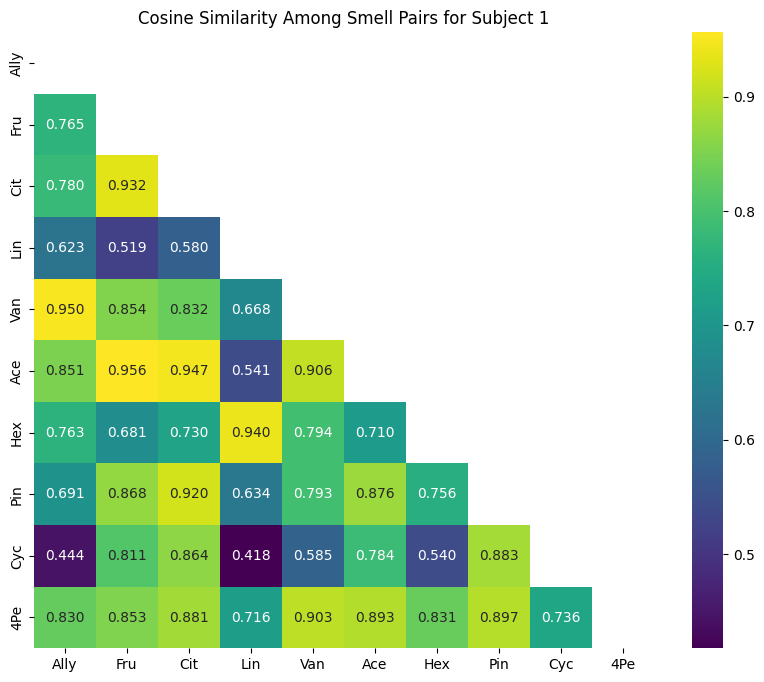

In [125]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics.pairwise import cosine_similarity
from itertools import combinations

# Assuming all_features_matrix and all_labels are already defined
# Example all_features_matrix and all_labels (replace these with your actual data)
# all_features_matrix = np.random.rand(220, 300)
# all_labels = [2, 3, 6, 7, 9, 10, 16, 17, 21, 22] * 22

# Define the order of smell IDs and their labels
d = {2: 'Ally', 3: 'Fru', 6: 'Cit', 7: 'Lin', 9: 'Van', 10: 'Ace', 16: 'Hex', 17: 'Pin', 21: 'Cyc', 22: '4Pe'}
unique_smell_ids = list(d.keys())
encoded_labels = [d[label] for label in unique_smell_ids]

# Parameters
num_subjects = 22
num_smells = 10
num_pairs = 45

# Initialize the similarity matrix
cosine_similarity_matrix = np.zeros((num_subjects, num_pairs))

# Initialize the list to store the pair names
pair_names = []

# Calculate the cosine similarity for each subject
for subject_idx in range(num_subjects):
    # Extract the features for the current subject
    subject_features = all_features_matrix[subject_idx * num_smells:(subject_idx + 1) * num_smells, :]
    # Calculate the cosine similarity for each pair of smells
    pairwise_similarities = []
    for (i, j) in combinations(range(num_smells), 2):
        if subject_idx == 0:
            pair_names.append(f"{encoded_labels[i]} - {encoded_labels[j]}")
        similarity = cosine_similarity(subject_features[i].reshape(1, -1), subject_features[j].reshape(1, -1))[0, 0]
        pairwise_similarities.append(similarity)

    # Store the results in the similarity matrix
    cosine_similarity_matrix[subject_idx, :] = pairwise_similarities

# Create a matrix to hold the cosine similarity values for the first subject

cosine_similarity_first_subject = np.zeros((num_smells, num_smells))

# Populate the matrix for the first subject
index = 0
for (i, j) in combinations(range(num_smells), 2):
    cosine_similarity_first_subject[i, j] = cosine_similarity_matrix[0, index]
    cosine_similarity_first_subject[j, i] = cosine_similarity_matrix[0, index]
    index += 1

# Mask out the upper triangular part of the matrix
mask = np.triu(np.ones_like(cosine_similarity_first_subject, dtype=bool))

# Plot the lower triangular part of the cosine similarity matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cosine_similarity_first_subject, cmap='viridis', mask=mask, annot=True, fmt=".3f", cbar=True,
            xticklabels=encoded_labels, yticklabels=encoded_labels)
plt.title('Cosine Similarity Among Smell Pairs for Subject 1')
plt.show()


In [126]:
mean_similarity= np.mean(cosine_similarity_matrix, axis=0)

In [127]:
mean_similarity

array([0.89613159, 0.87365957, 0.83013691, 0.87065498, 0.87667997,
       0.87998169, 0.85383893, 0.8293485 , 0.90392856, 0.86876578,
       0.8071248 , 0.82645992, 0.8585288 , 0.84606087, 0.84097246,
       0.84894773, 0.87382105, 0.84918477, 0.86657628, 0.88967808,
       0.84524074, 0.83975372, 0.86048107, 0.86686499, 0.84809918,
       0.82163045, 0.87775853, 0.80454825, 0.80035039, 0.85008194,
       0.82152121, 0.84003096, 0.82071007, 0.83854039, 0.87981199,
       0.8447266 , 0.85269678, 0.8125114 , 0.84194488, 0.80173643,
       0.82136212, 0.87819948, 0.80686417, 0.86699364, 0.86112245])

In [128]:
Similarity = mat73.loadmat('/Users/ritwikghosh/Downloads/ProcData/Perception/RawData/similarity.mat')
S = Similarity['percep']
perception_similarity_values = np.mean(S, axis=0)

In [129]:
perception_similarity_values

array([66.40909091, 65.34090909, 59.43181818, 50.45454545, 58.45454545,
       55.25      , 48.90909091, 14.20454545, 42.68181818, 60.54545455,
       54.45454545, 53.72727273, 48.25      , 61.        , 54.25      ,
       21.20454545, 40.56818182, 63.5       , 52.95454545, 53.56818182,
       52.22727273, 56.79545455, 18.54545455, 39.40909091, 53.68181818,
       47.86363636, 48.79545455, 50.90909091, 24.25      , 37.45454545,
       48.84090909, 55.47727273, 42.15909091, 22.02272727, 37.31818182,
       47.81818182, 54.65909091, 24.06818182, 36.63636364, 45.75      ,
       21.52272727, 38.29545455, 18.47727273, 33.13636364, 44.34090909])

In [77]:
from sklearn.model_selection import cross_val_score

# Train SVM model with cross-validation
svm_model = SVC(kernel='rbf',)
scores = cross_val_score(svm_model, all_features_matrix, all_labels, cv=5)

# Print the accuracy scores
print("Accuracy scores:", scores)

# Print the mean accuracy and standard deviation
print("Mean accuracy:", scores.mean())
print("Standard deviation:", scores.std())


Accuracy scores: [0.13636364 0.11363636 0.20454545 0.15909091 0.22727273]
Mean accuracy: 0.16818181818181818
Standard deviation: 0.042152811343162296


In [52]:
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import classification_report

# Train SVM model with cross-validation and get predictions
svm_model = SVC(kernel='rbf')
y_pred_cv = cross_val_predict(svm_model, all_features_matrix, all_labels, cv=5)

# Print classification report
print(classification_report(all_labels, y_pred_cv))


              precision    recall  f1-score   support

         2.0       0.20      0.36      0.26        22
         3.0       0.17      0.09      0.12        22
         6.0       0.00      0.00      0.00        22
         7.0       0.27      0.18      0.22        22
         9.0       0.21      0.32      0.25        22
        10.0       0.07      0.05      0.05        22
        16.0       0.07      0.09      0.08        22
        17.0       0.75      0.14      0.23        22
        21.0       0.19      0.45      0.27        22
        22.0       0.00      0.00      0.00        22

    accuracy                           0.17       220
   macro avg       0.19      0.17      0.15       220
weighted avg       0.19      0.17      0.15       220



In [53]:
len(all_labels)

220

In [78]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import MaxAbsScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import cross_val_score
from sklearn.svm import SVC

# Create a pipeline with MaxAbsScaler, PCA, and SVM model
svm_pipeline = make_pipeline(PCA(n_components=3), SVC(kernel='rbf', C=3))

# Compute cross-validated scores
scores = cross_val_score(svm_pipeline, all_features_matrix, all_labels, cv=10)

# Print cross-validated scores
print("Cross-validated scores:", scores)

# Print mean cross-validated score
print("Mean cross-validated score:", scores.mean())
print("Standard Deviation cross-validated score:", scores.std())

Cross-validated scores: [0.09090909 0.22727273 0.09090909 0.27272727 0.18181818 0.22727273
 0.18181818 0.13636364 0.31818182 0.22727273]
Mean cross-validated score: 0.19545454545454546
Standard Deviation cross-validated score: 0.07056443043754555


In [18]:
from sklearn.ensemble import ExtraTreesClassifier

In [55]:
rf_pipeline = make_pipeline(PCA(n_components=15),ExtraTreesClassifier(n_estimators=143, max_depth=13,random_state=0))

# Compute cross-validated scores
scores = cross_val_score(rf_pipeline, all_features_matrix, all_labels, cv=10)

# Print cross-validated scores
print("Cross-validated scores:", scores)

# Print mean cross-validated score
print("Mean cross-validated score:", scores.mean())
print("Standard Deviation cross-validated score:", scores.std())

Cross-validated scores: [0.18181818 0.36363636 0.09090909 0.18181818 0.22727273 0.31818182
 0.22727273 0.04545455 0.31818182 0.18181818]
Mean cross-validated score: 0.21363636363636362
Standard Deviation cross-validated score: 0.09545454545454546


In [136]:
y_pred_cv=cross_val_predict(svm_pipeline, all_features_matrix, all_labels, cv=10)
print(classification_report(all_labels, y_pred_cv))

              precision    recall  f1-score   support

         2.0       0.17      0.32      0.22        22
         3.0       0.23      0.23      0.23        22
         6.0       0.17      0.09      0.12        22
         7.0       0.30      0.27      0.29        22
         9.0       0.25      0.18      0.21        22
        10.0       0.10      0.09      0.09        22
        16.0       0.00      0.00      0.00        22
        17.0       0.22      0.18      0.20        22
        21.0       0.20      0.41      0.27        22
        22.0       0.25      0.18      0.21        22

    accuracy                           0.20       220
   macro avg       0.19      0.20      0.18       220
weighted avg       0.19      0.20      0.18       220



In [137]:
y_pred_cv=cross_val_predict(rf_pipeline, all_features_matrix, all_labels, cv=10)
print(classification_report(all_labels, y_pred_cv))

              precision    recall  f1-score   support

         2.0       0.12      0.09      0.10        22
         3.0       0.14      0.18      0.16        22
         6.0       0.21      0.18      0.20        22
         7.0       0.24      0.27      0.26        22
         9.0       0.37      0.32      0.34        22
        10.0       0.15      0.14      0.14        22
        16.0       0.11      0.14      0.12        22
        17.0       0.28      0.23      0.25        22
        21.0       0.31      0.50      0.39        22
        22.0       0.18      0.09      0.12        22

    accuracy                           0.21       220
   macro avg       0.21      0.21      0.21       220
weighted avg       0.21      0.21      0.21       220



In [138]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import MaxAbsScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import ExtraTreesClassifier
import numpy as np

# Initialize arrays to store mean cross-validated scores and standard deviations
mean_scores = []
std_scores = []

# Loop through different numbers of PCA components
for n_components in range(1, 41):
    # Create a pipeline with MaxAbsScaler, PCA, and Random Forest model
    rf_pipeline = make_pipeline(PCA(n_components=n_components), ExtraTreesClassifier(random_state=0, max_depth=13, n_estimators=105))

    # Compute cross-validated scores
    scores = cross_val_score(rf_pipeline, all_features_matrix, all_labels, cv=10)
    
    # Print results after each iteration
    print(f"PCA components: {n_components}, Mean cross-validated score: {scores.mean()}, Standard Deviation cross-validated score: {scores.std()}")
    
    # Store mean and standard deviation scores
    mean_scores.append(scores.mean())
    std_scores.append(scores.std())

# Print final results



PCA components: 1, Mean cross-validated score: 0.11818181818181817, Standard Deviation cross-validated score: 0.09359663764533636
PCA components: 2, Mean cross-validated score: 0.12272727272727273, Standard Deviation cross-validated score: 0.07343406555183414
PCA components: 3, Mean cross-validated score: 0.10454545454545454, Standard Deviation cross-validated score: 0.05767535245658873
PCA components: 4, Mean cross-validated score: 0.10909090909090909, Standard Deviation cross-validated score: 0.05821022034029862
PCA components: 5, Mean cross-validated score: 0.10909090909090909, Standard Deviation cross-validated score: 0.046354722850843494
PCA components: 6, Mean cross-validated score: 0.1, Standard Deviation cross-validated score: 0.04895604370122276
PCA components: 7, Mean cross-validated score: 0.09090909090909091, Standard Deviation cross-validated score: 0.05749595745760689
PCA components: 8, Mean cross-validated score: 0.12727272727272726, Standard Deviation cross-validated sc

In [ ]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import MaxAbsScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import ExtraTreesClassifier
import numpy as np

# Initialize arrays to store mean cross-validated scores and standard deviations
mean_scores = []
std_scores = []

# Set n_components and max_depth
n_components = 15
max_depth = 13

# Loop through different numbers of n_estimators
for n_estimators in range(50, 127):
    # Create a pipeline with MaxAbsScaler, PCA, and ExtraTreesClassifier model
    rf_pipeline = make_pipeline(PCA(n_components=n_components), ExtraTreesClassifier(random_state=0, max_depth=max_depth, n_estimators=n_estimators, bootstrap=True))

    # Compute cross-validated scores
    scores = cross_val_score(rf_pipeline, all_features_matrix, all_labels, cv=10)
    
    # Print results after each iteration
    print(f"n_estimators: {n_estimators}, Mean cross-validated score: {scores.mean()}, Standard Deviation cross-validated score: {scores.std()}")
    
    # Store mean and standard deviation scores
    mean_scores.append(scores.mean())
    std_scores.append(scores.std())



In [40]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import MaxAbsScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import ExtraTreesClassifier

# Define the range of min_samples_split
min_samples_split_range = range(2, 9)

# Set n_components, max_depth, and n_estimators
n_components = 15
max_depth = 13
n_estimators = 143

# Loop through different values of min_samples_split
for min_samples_split in min_samples_split_range:
    # Create a pipeline with MaxAbsScaler, PCA, and ExtraTreesClassifier model
    rf_pipeline = make_pipeline(
        PCA(n_components=n_components),
        ExtraTreesClassifier(random_state=0, max_depth=max_depth, n_estimators=n_estimators, min_samples_split=min_samples_split, bootstrap=True)
    )

    # Compute cross-validated scores
    scores = cross_val_score(rf_pipeline, all_features_matrix, all_labels, cv=10)

    # Print results after each iteration
    print(f"Min Samples Split: {min_samples_split}, Mean cross-validated score: {scores.mean()}, Standard Deviation cross-validated score: {scores.std()}")


Min Samples Split: 2, Mean cross-validated score: 0.1590909090909091, Standard Deviation cross-validated score: 0.08194434716963611
Min Samples Split: 3, Mean cross-validated score: 0.18181818181818182, Standard Deviation cross-validated score: 0.05749595745760689
Min Samples Split: 4, Mean cross-validated score: 0.17727272727272725, Standard Deviation cross-validated score: 0.05548434370788047
Min Samples Split: 5, Mean cross-validated score: 0.19090909090909092, Standard Deviation cross-validated score: 0.05300865358950273
Min Samples Split: 6, Mean cross-validated score: 0.19545454545454546, Standard Deviation cross-validated score: 0.04568125282327677
Min Samples Split: 7, Mean cross-validated score: 0.16818181818181818, Standard Deviation cross-validated score: 0.07056443043754555
Min Samples Split: 8, Mean cross-validated score: 0.17727272727272728, Standard Deviation cross-validated score: 0.062489668567579634


In [139]:
print("Number of samples:", all_features_matrix.shape[0])
print("Number of features:", all_features_matrix.shape[1])


Number of samples: 220
Number of features: 300


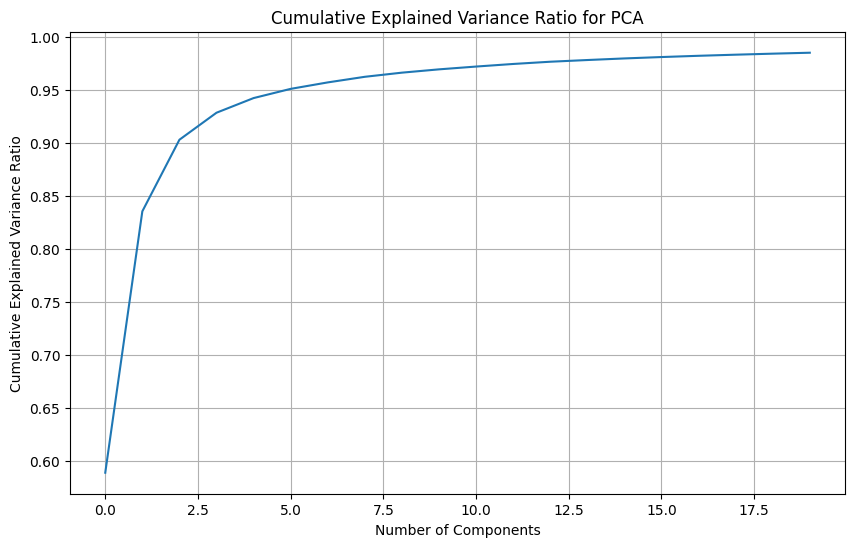

In [140]:
pca = PCA(n_components=20)
pca.fit(all_features_matrix)

# Plot the cumulative explained variance ratio
plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance Ratio for PCA')
plt.grid(True)
plt.show()

In [191]:
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import MaxAbsScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import cross_val_score
from sklearn.svm import SVC

# Define the range of components
n_components_range = range(1, 30)

# Create an empty list to store mean accuracies
mean_accuracies = []

# Loop through each number of components
for n_components in n_components_range:
    # Create a pipeline with MaxAbsScaler, PCA, and SVM model
    svm_pipeline = make_pipeline(PCA(n_components=n_components), SVC(kernel='rbf', C=1))
    
    # Compute cross-validated scores
    scores = cross_val_score(svm_pipeline, all_features_matrix, all_labels, cv=10)
    
    # Compute mean cross-validated score
    mean_accuracy = scores.mean()
    
    # Append mean accuracy to the list
    mean_accuracies.append(mean_accuracy)

# Print mean accuracies for different numbers of components
for i, mean_accuracy in enumerate(mean_accuracies, 1):
    print(f"Mean accuracy for n_components={i}: {mean_accuracy}")


Mean accuracy for n_components=1: 0.12727272727272726
Mean accuracy for n_components=2: 0.16818181818181818
Mean accuracy for n_components=3: 0.1590909090909091
Mean accuracy for n_components=4: 0.1590909090909091
Mean accuracy for n_components=5: 0.15454545454545454
Mean accuracy for n_components=6: 0.1727272727272727
Mean accuracy for n_components=7: 0.18636363636363637
Mean accuracy for n_components=8: 0.18181818181818182
Mean accuracy for n_components=9: 0.17272727272727273
Mean accuracy for n_components=10: 0.17272727272727273
Mean accuracy for n_components=11: 0.1772727272727273
Mean accuracy for n_components=12: 0.17272727272727273
Mean accuracy for n_components=13: 0.17272727272727273
Mean accuracy for n_components=14: 0.1772727272727273
Mean accuracy for n_components=15: 0.16818181818181818
Mean accuracy for n_components=16: 0.1772727272727273
Mean accuracy for n_components=17: 0.18181818181818182
Mean accuracy for n_components=18: 0.18181818181818182
Mean accuracy for n_compo

In [26]:
from sklearn.utils.multiclass import unique_labels
from itertools import combinations

# Initialize lists to store results
all_labels_array=np.array(all_labels)
pairwise_scores = []

# Iterate over all possible pairs of unique smells
for smell1, smell2 in combinations(unique_smell_ids, 2):
    # Filter data for the current pair of smells
    indices = np.where((all_labels_array == smell1) | (all_labels_array == smell2))[0]
    pair_features = all_features_matrix[indices]
    pair_labels = all_labels_array[indices]
    
    # Check if both classes are present in pair_labels
    unique_classes = unique_labels(pair_labels)
    if len(unique_classes) < 2:
        continue  # Skip this pair if only one class is present
    
    # Train SVM model with cross-validation
    svm_pipeline = make_pipeline(PCA(n_components=2), SVC(kernel='rbf', C=1))
    scores = cross_val_score(svm_pipeline, pair_features, pair_labels, cv=5)
    
    # Store the cross-validation scores for the pair
    pairwise_scores.append((smell1, smell2, scores.mean(), scores.std()))

# Print the pairwise classification results
for smell1, smell2, mean_accuracy, std_dev in pairwise_scores:
    print(f"Pair: {smell1} vs {smell2}")
    print("Mean accuracy:", mean_accuracy)
    print("Standard deviation:", std_dev)
    print()


Pair: 2.0 vs 3.0
Mean accuracy: 0.6611111111111111
Standard deviation: 0.11706281947614156

Pair: 2.0 vs 6.0
Mean accuracy: 0.5
Standard deviation: 0.04969039949999535

Pair: 2.0 vs 7.0
Mean accuracy: 0.5916666666666667
Standard deviation: 0.046147910349544845

Pair: 2.0 vs 9.0
Mean accuracy: 0.5194444444444445
Standard deviation: 0.14153043558729997

Pair: 2.0 vs 10.0
Mean accuracy: 0.5222222222222223
Standard deviation: 0.08314794192830981

Pair: 2.0 vs 16.0
Mean accuracy: 0.5472222222222223
Standard deviation: 0.05800170282728084

Pair: 2.0 vs 17.0
Mean accuracy: 0.663888888888889
Standard deviation: 0.11666666666666665

Pair: 2.0 vs 21.0
Mean accuracy: 0.6194444444444445
Standard deviation: 0.1764708908252066

Pair: 2.0 vs 22.0
Mean accuracy: 0.7083333333333333
Standard deviation: 0.17786456215091245

Pair: 3.0 vs 6.0
Mean accuracy: 0.5722222222222222
Standard deviation: 0.09875771574795099

Pair: 3.0 vs 7.0
Mean accuracy: 0.5027777777777778
Standard deviation: 0.10258991840344106


In [25]:
type(all_labels_array)

list

In [27]:
s=0
for i in range(45):
    s=s+pairwise_scores[i][2]
print(s/45)    

0.5691975308641974


In [28]:
import csv

# Define the file path where you want to save the pairwise scores
file_path = '/Users/ritwikghosh/Downloads/Pair/pairwise_scores.csv'

# Write the pairwise scores to a CSV file
with open(file_path, 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(['Smell1', 'Smell2', 'Mean Accuracy', 'Standard Deviation'])
    for score in pairwise_scores:
        smell1, smell2, mean_accuracy, std_dev = score
        writer.writerow([smell1, smell2, mean_accuracy, std_dev])

print(f"Pairwise scores saved to: {file_path}")


Pairwise scores saved to: /Users/ritwikghosh/Downloads/Pair/pairwise_scores.csv


In [29]:
unique_smell_ids

array([ 2.,  3.,  6.,  7.,  9., 10., 16., 17., 21., 22.])

In [30]:
import csv

# Define the file path
file_path = '/Users/ritwikghosh/Downloads/Pair/all_labels.csv'

# Write the all_labels list to a CSV file
with open(file_path, 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(['Label'])
    writer.writerows([[label] for label in all_labels])

print(f"All labels saved to: {file_path}")


All labels saved to: /Users/ritwikghosh/Downloads/Pair/all_labels.csv


In [60]:
import pandas as pd
features_df= pd.read_csv('/Users/ritwikghosh/Downloads/Features Df/features_df.csv')

In [31]:
np.unique(np.array(all_labels))

array([ 2.,  3.,  6.,  7.,  9., 10., 16., 17., 21., 22.])

['Ally', 'Fru', 'Cit', 'Lin', 'Van', 'Ace', 'Hex', 'Pin', 'Cyc', '4Pe']


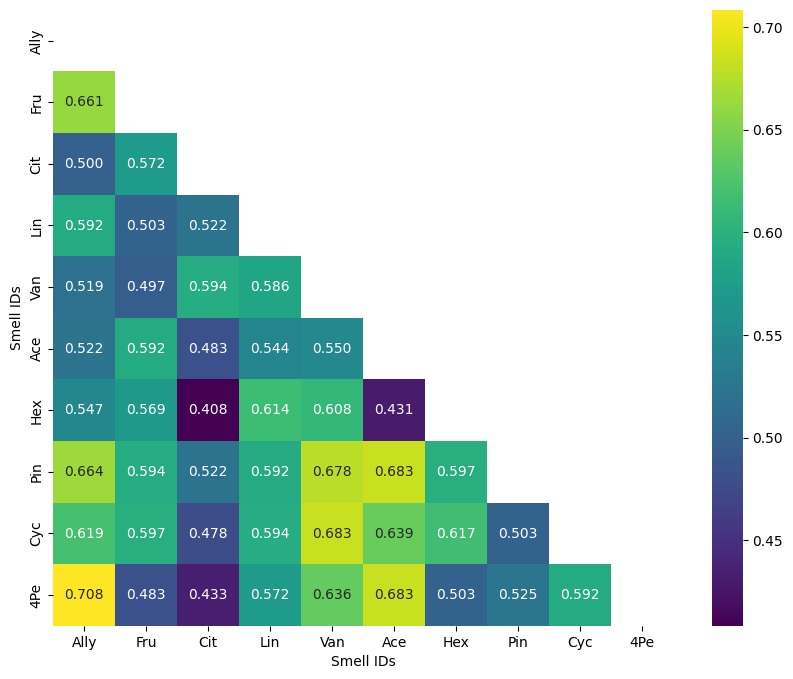

In [56]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

d= {2: 'Ally', 3: 'Fru', 6: 'Cit', 7: 'Lin', 9: 'Van', 10: 'Ace', 16: 'Hex', 17: 'Pin', 21: 'Cyc', 22: '4Pe'}

# Initialize a matrix to store mean accuracy values (assuming these are defined in your code)
accuracy_matrix = np.zeros((len(unique_smell_ids), len(unique_smell_ids)))

# Populate the accuracy matrix with mean accuracy values (assuming pairwise_scores is defined)
for score in pairwise_scores:
    smell1, smell2, mean_accuracy, _ = score
    row_index = np.where(unique_smell_ids == smell1)[0][0]
    col_index = np.where(unique_smell_ids == smell2)[0][0]
    accuracy_matrix[row_index, col_index] = mean_accuracy
    accuracy_matrix[col_index, row_index] = mean_accuracy  # Symmetric matrix

# Mask out the upper triangular part of the matrix
mask = np.triu(np.ones_like(accuracy_matrix, dtype=bool))

unique_smell_ids=np.unique(np.array(all_labels))
# Create encoded labels for x and y tick labels using the dictionary `d`
encoded_xticklabels = [d[id] for id in unique_smell_ids]
encoded_yticklabels = [d[id] for id in unique_smell_ids]

print(encoded_xticklabels)
# Plot the lower triangular part of the accuracy matrix with a different colormap
plt.figure(figsize=(10, 8))
sns.heatmap(accuracy_matrix, cmap='viridis', mask=mask, annot=True, fmt=".3f", cbar=True,
            xticklabels=encoded_xticklabels, yticklabels=encoded_yticklabels)
plt.xlabel('Smell IDs')
plt.ylabel('Smell IDs')

# Save the plot as a PDF file
directory = '/Users/ritwikghosh/Downloads/PDF images of Research Paper'
save_loc = os.path.join(directory, 'accuracy_matrix.pdf')
plt.savefig(save_loc, format='pdf')

# Display the plot
plt.show()


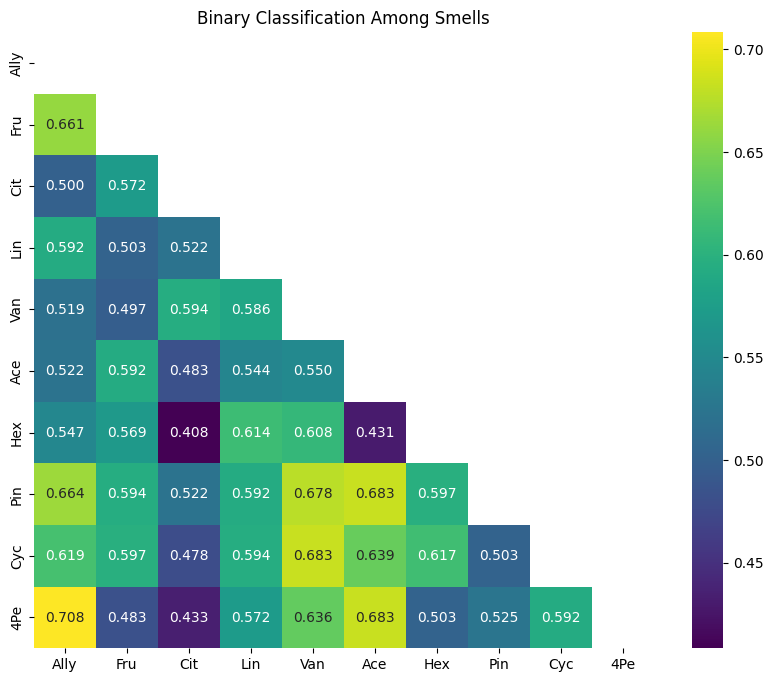

In [79]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import make_pipeline
import mat73

# Assuming all_labels, all_features_matrix, and unique_smell_ids are already defined
# Initialize lists to store results
all_labels_array = np.array(all_labels)

# Initialize lists to store results
pairwise_scores = []

# Iterate over all possible pairs of unique smells
for smell1, smell2 in combinations(unique_smell_ids, 2):
    # Filter data for the current pair of smells
    indices = np.where((all_labels_array == smell1) | (all_labels_array == smell2))[0]
    pair_features = all_features_matrix[indices]
    pair_labels = all_labels_array[indices]  # Direct numpy indexing
    
    # Train SVM model with cross-validation
    svm_pipeline = make_pipeline(PCA(n_components=2), SVC(kernel='rbf', C=1))
    scores = cross_val_score(svm_pipeline, pair_features, pair_labels, cv=5)
    
    # Store the cross-validation scores for the pair
    pairwise_scores.append((smell1, smell2, scores.mean(), scores.std()))

# Dictionary for smell ID to label conversion
d = {2: 'Ally', 3: 'Fru', 6: 'Cit', 7: 'Lin', 9: 'Van', 10: 'Ace', 16: 'Hex', 17: 'Pin', 21: 'Cyc', 22: '4Pe'}

# Encode smell IDs using the dictionary
encoded_smell_ids = [d[id] for id in unique_smell_ids]

# Initialize a matrix to store mean accuracy values
accuracy_matrix = np.zeros((len(unique_smell_ids), len(unique_smell_ids)))

# Populate the accuracy matrix with mean accuracy values
for score in pairwise_scores:
    smell1, smell2, mean_accuracy, _ = score
    row_index = np.where(unique_smell_ids == smell1)[0][0]
    col_index = np.where(unique_smell_ids == smell2)[0][0]
    accuracy_matrix[row_index, col_index] = mean_accuracy
    accuracy_matrix[col_index, row_index] = mean_accuracy  # Symmetric matrix

# Mask out the upper triangular part of the matrix
mask = np.triu(np.ones_like(accuracy_matrix, dtype=bool))

# Plot the lower triangular part of the accuracy matrix with a different colormap
plt.figure(figsize=(10, 8))
sns.heatmap(accuracy_matrix, cmap='viridis', mask=mask, annot=True, fmt=".3f", cbar=True,
            xticklabels=encoded_smell_ids, yticklabels=encoded_smell_ids)
plt.title('Binary Classification Among Smells')
plt.show()


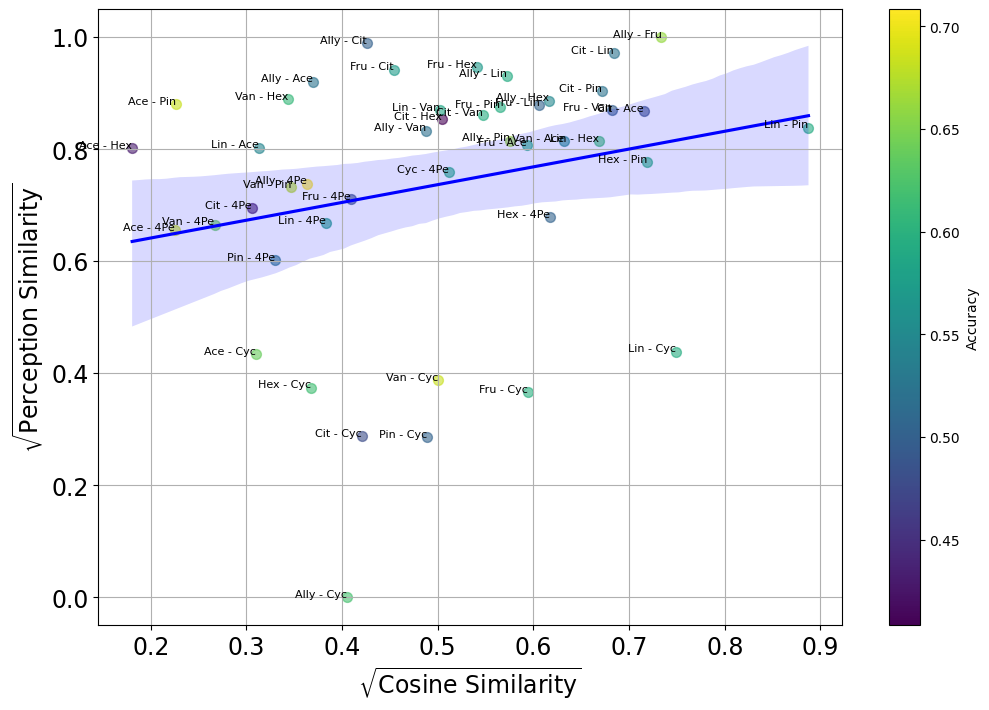

In [80]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import MinMaxScaler
import mat73
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd

# Initialize lists to store results
all_labels_array = np.array(all_labels)

features_df=pd.read_csv('/Users/ritwikghosh/Downloads/Features Df/features_df.csv')

# Initialize lists to store results
pairwise_scores = []

# Iterate over all possible pairs of unique smells
for smell1, smell2 in combinations(unique_smell_ids, 2):
    # Filter data for the current pair of smells
    indices = np.where((all_labels_array == smell1) | (all_labels_array == smell2))[0]
    pair_features = all_features_matrix[indices]
    pair_labels = all_labels_array[indices]  # Direct numpy indexing
    
    # Train SVM model with cross-validation
    svm_pipeline = make_pipeline(PCA(n_components=2), SVC(kernel='rbf', C=1))
    scores = cross_val_score(svm_pipeline, pair_features, pair_labels, cv=5)
    
    # Store the cross-validation scores for the pair
    pairwise_scores.append((smell1, smell2, scores.mean(), scores.std()))

# Dictionary for smell ID to label conversion
d = {2: 'Ally', 3: 'Fru', 6: 'Cit', 7: 'Lin', 9: 'Van', 10: 'Ace', 16: 'Hex', 17: 'Pin', 21: 'Cyc', 22: '4Pe'}

# Encode smell IDs using the dictionary
encoded_smell_ids = [d[id] for id in unique_smell_ids]

# Initialize a matrix to store mean accuracy values
accuracy_matrix = np.zeros((len(unique_smell_ids), len(unique_smell_ids)))

# Populate the accuracy matrix with mean accuracy values
for score in pairwise_scores:
    smell1, smell2, mean_accuracy, _ = score
    row_index = np.where(unique_smell_ids == smell1)[0][0]
    col_index = np.where(unique_smell_ids == smell2)[0][0]
    accuracy_matrix[row_index, col_index] = mean_accuracy
    accuracy_matrix[col_index, row_index] = mean_accuracy  # Symmetric matrix


# Load the similarity matrix
Similarity = mat73.loadmat('/Users/ritwikghosh/Downloads/ProcData/Perception/RawData/similarity.mat')
S = Similarity['percep']
perception_similarity_values = np.mean(S, axis=0)

perception_similarity_values = perception_similarity_values.reshape(-1, 1)

# Initialize the MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))

# Fit the scaler to your data and transform it
scaled_values = scaler.fit_transform(perception_similarity_values)

# If you want to reshape it back to a 1D array
perception_similarity_values = scaled_values.flatten()

# Assuming features_df is already defined
# Example features_df (replace this with your actual data)
# features_df = pd.DataFrame(np.random.rand(800, 10), columns=['Ally', 'Fru', 'Cit', 'Lin', 'Van', 'Ace', 'Hex', 'Pin', 'Cyc', '4Pe'])

# Calculate cosine similarity among the smell pairs
cosine_similarity_values = []
smell_names = features_df.columns
for smell1, smell2 in combinations(smell_names, 2):
    features1 = features_df[smell1].values.reshape(1, -1)
    features2 = features_df[smell2].values.reshape(1, -1)
    cos_sim = cosine_similarity(features1, features2)[0, 0]
    cosine_similarity_values.append(cos_sim)

# Convert cosine similarity values to a numpy array
cosine_similarity_values = np.array(cosine_similarity_values)

cosine_similarity_values = cosine_similarity_values ** 0.5
perception_similarity_values = perception_similarity_values ** 0.5

# Define the order of smell pairs
pair_names = ['Ally - Fru', 'Ally - Cit', 'Ally - Lin', 'Ally - Van', 'Ally - Ace', 'Ally - Hex', 'Ally - Pin', 'Ally - Cyc', 'Ally - 4Pe', 
              'Fru - Cit', 'Fru - Lin', 'Fru - Van', 'Fru - Ace', 'Fru - Hex', 'Fru - Pin', 'Fru - Cyc', 'Fru - 4Pe', 
              'Cit - Lin', 'Cit - Van', 'Cit - Ace', 'Cit - Hex', 'Cit - Pin', 'Cit - Cyc', 'Cit - 4Pe', 
              'Lin - Van', 'Lin - Ace', 'Lin - Hex', 'Lin - Pin', 'Lin - Cyc', 'Lin - 4Pe', 
              'Van - Ace', 'Van - Hex', 'Van - Pin', 'Van - Cyc', 'Van - 4Pe', 
              'Ace - Hex', 'Ace - Pin', 'Ace - Cyc', 'Ace - 4Pe', 
              'Hex - Pin', 'Hex - Cyc', 'Hex - 4Pe', 
              'Pin - Cyc', 'Pin - 4Pe', 'Cyc - 4Pe']

# Extract accuracy values for each pair
accuracy_values = []
for smell1, smell2 in combinations(encoded_smell_ids, 2):
    row_index = encoded_smell_ids.index(smell1)
    col_index = encoded_smell_ids.index(smell2)
    accuracy_values.append(accuracy_matrix[row_index, col_index])

# Create a colormap
colormap = plt.cm.viridis

# Plot the cosine similarity values against perception similarity values with color shading
plt.figure(figsize=(12, 8))
ax = plt.gca()  # Get current axes

# Use seaborn to create a scatter plot with color shading based on accuracy values
norm = plt.Normalize(vmin=min(accuracy_values), vmax=max(accuracy_values))
colors = [colormap(norm(value)) for value in accuracy_values]
for i, pair_name in enumerate(pair_names):
    plt.scatter(cosine_similarity_values[i], perception_similarity_values[i], color=colors[i], s=50, alpha=0.6)

# Add color bar to indicate accuracy
sm = plt.cm.ScalarMappable(cmap=colormap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Accuracy')

# Fit the trend line using seaborn regplot
sns.regplot(x=cosine_similarity_values, y=perception_similarity_values, scatter=False, ax=ax, color='blue')

# Annotate the points with pair names
for i, pair_name in enumerate(pair_names):
    plt.annotate(pair_name, (cosine_similarity_values[i], perception_similarity_values[i]), fontsize=8, ha='right')

plt.xlabel(r'$\sqrt{\mathrm{Cosine\ Similarity}}$', fontsize=17)
plt.ylabel(r'$\sqrt{\mathrm{Perception\ Similarity}}$', fontsize=17)
plt.title('')
plt.xticks(fontsize=17)
plt.yticks(fontsize=17)
plt.grid(True)

plt.savefig('/Users/ritwikghosh/Downloads/Pair/vibration_vs_percep_cos(x)_vs_percep(x).pdf')
plt.show()


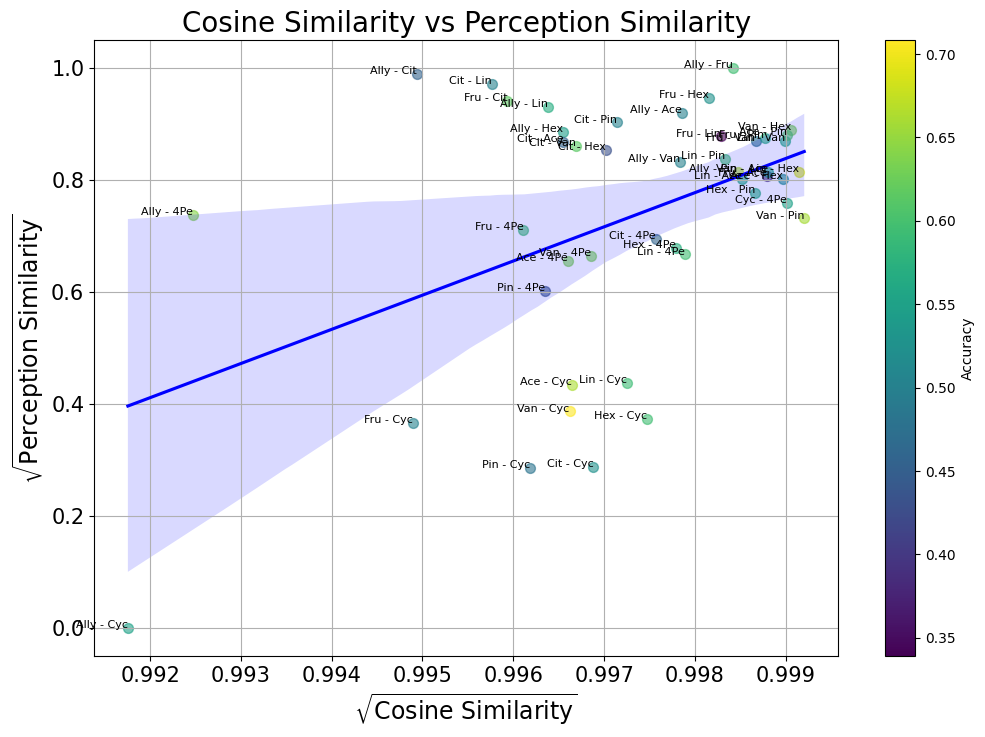

In [81]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics.pairwise import cosine_similarity
import mat73

# Step 1: Load the perception similarity matrix
similarity_data = mat73.loadmat('/Users/ritwikghosh/Downloads/ProcData/Perception/RawData/similarity.mat')
perception_similarity_matrix = similarity_data['percep']

# Convert the perception similarity matrix to a pairwise similarity array (mean values)
perception_similarity_values = np.mean(perception_similarity_matrix, axis=0)

# Step 2: Prepare the new 220 rows of feature data and corresponding IDs
features_matrix = all_features_matrix  # Shape: (220, 300)
labels_array = all_labels_array  # Shape: (220,)

# Step 3: Define the mapping dictionary for Ids to names
d = {2: 'Ally', 3: 'Fru', 6: 'Cit', 7: 'Lin', 9: 'Van', 10: 'Ace', 16: 'Hex', 17: 'Pin', 21: 'Cyc', 22: '4Pe'}

# Extract unique IDs
unique_ids = np.unique(labels_array)

# Step 4: Initialize lists to store accuracy scores, cosine similarities, and pair names
accuracy_scores = []
cosine_similarity_values = []
id_pairs = []

# Step 5: Iterate over all possible pairs of unique IDs
for id1, id2 in combinations(unique_ids, 2):
    # Filter data for the current pair of IDs
    indices = np.where((labels_array == id1) | (labels_array == id2))[0]
    pair_features = features_matrix[indices]
    pair_labels = labels_array[indices]

    # Step 6: Create a pipeline with MinMaxScaler, PCA, and SVM
    svm_pipeline = make_pipeline(MinMaxScaler(), PCA(n_components=2), SVC(kernel='rbf', C=1))

    # Step 7: Perform 5-fold cross-validation and calculate accuracy
    accuracy = cross_val_score(svm_pipeline, pair_features, pair_labels, cv=5).mean()
    accuracy_scores.append(accuracy)

    # Step 8: Calculate cosine similarity for the averaged features of the pair
    features1 = np.mean(pair_features[pair_labels == id1], axis=0).reshape(1, -1)
    features2 = np.mean(pair_features[pair_labels == id2], axis=0).reshape(1, -1)
    cos_sim = cosine_similarity(features1, features2)[0, 0]
    cosine_similarity_values.append(cos_sim)

    # Step 9: Store the pair name
    pair_name = f"{d[id1]} - {d[id2]}"
    id_pairs.append(pair_name)

# Step 10: Normalize the perception similarity values between 0 and 1
scaler = MinMaxScaler(feature_range=(0, 1))
perception_similarity_values = scaler.fit_transform(perception_similarity_values.reshape(-1, 1)).flatten()

# Apply the square root transformation (if required)
cosine_similarity_values = np.array(cosine_similarity_values) ** 0.5
perception_similarity_values = perception_similarity_values ** 0.5

# Step 11: Plotting the relation between cosine similarity and perception similarity, colored by accuracy
plt.figure(figsize=(12, 8))
ax = plt.gca()

# Normalize for color shading using accuracy scores
norm = plt.Normalize(vmin=min(accuracy_scores), vmax=max(accuracy_scores))
colors = [plt.cm.viridis(norm(acc)) for acc in accuracy_scores]

# Scatter plot of cosine similarity vs. perception similarity
for i, pair_name in enumerate(id_pairs):
    plt.scatter(cosine_similarity_values[i], perception_similarity_values[i], color=colors[i], s=50, alpha=0.6)

# Add a color bar for accuracy
sm = plt.cm.ScalarMappable(cmap='viridis', norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Accuracy')

# Fit a trend line using seaborn regplot
sns.regplot(x=cosine_similarity_values, y=perception_similarity_values, scatter=False, ax=ax, color='blue')

# Annotate the points with id pairs (names)
for i, pair_name in enumerate(id_pairs):
    plt.annotate(pair_name, (cosine_similarity_values[i], perception_similarity_values[i]), fontsize=8, ha='right')

# Labels and title with LaTeX formatting for square root
plt.xlabel(r'$\sqrt{\mathrm{Cosine\ Similarity}}$', fontsize=17)
plt.ylabel(r'$\sqrt{\mathrm{Perception\ Similarity}}$', fontsize=17)
plt.title('Cosine Similarity vs Perception Similarity', fontsize=20)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.grid(True)

# Save the plot
plt.savefig('/Users/ritwikghosh/Downloads/Pair/topo_features_cosine_vs_perception_similarity_with_accuracy_new_data.pdf')
plt.show()


In [42]:
pip install rdkit

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.5/27.5 MB 2.0 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.


In [101]:
import pandas as pd
df= pd.read_csv('/Users/ritwikghosh/Documents/Smell Smile_ID - Sheet1 (1).csv')
df= df.iloc[:10]

def path_based_fing(df):
    # Initialize a list to store fingerprints and corresponding molecule names
    np_fps = []
    molecule_names = []

    # Iterate over each SMILES string
    for index, row in df.iterrows():
        SMILES_string = row["Smile ID"]
        molecule_name = row["Id"]

        if pd.notna(SMILES_string):
            mol = Chem.rdmolfiles.MolFromSmiles(str(SMILES_string))
            if mol:
                # Generate the fingerprint
                fp = Chem.RDKFingerprint(mol, fpSize=1024)

                # Convert fingerprint to binary numpy array
                arr = np.zeros((1,), dtype=int)
                DataStructs.ConvertToNumpyArray(fp, arr)

                # Append the fingerprint and molecule name
                np_fps.append(arr)
                molecule_names.append(molecule_name)

    # Create a DataFrame from the fingerprints and add the molecule names
    features_df = pd.DataFrame(np_fps)
    features_df["Molecule Name"] = molecule_names

    return features_df

import pandas as pd
from rdkit import Chem
from rdkit import DataStructs
import numpy as np

finger = path_based_fing(df)


In [102]:
finger

,0,1,2,3,4,5,6,7,8,9,...,1015,1016,1017,1018,1019,1020,1021,1022,1023,Molecule Name
0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,2.0
1,0,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,3.0
2,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,6.0
3,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,1,0,7.0
4,0,0,1,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,0,1,9.0
5,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,10.0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,16.0
7,0,0,0,0,0,0,1,0,1,0,...,0,0,1,0,0,0,0,0,1,17.0
8,0,0,0,0,0,0,0,1,0,0,...,0,1,1,0,0,0,0,0,1,21.0
9,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,22.0


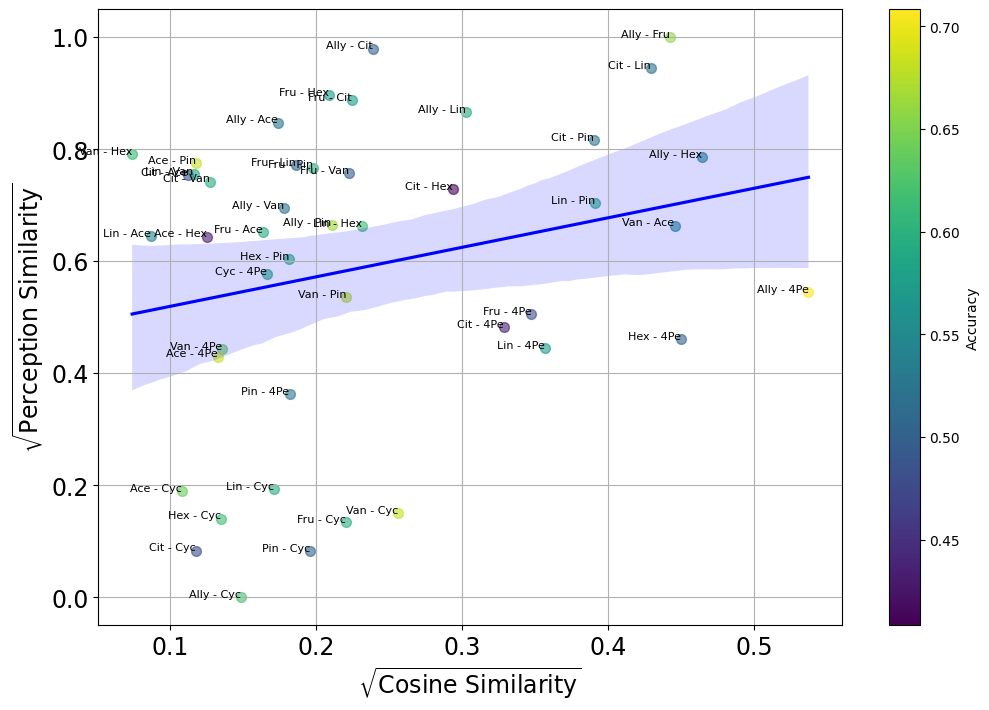

In [104]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd
import mat73
from sklearn.preprocessing import MinMaxScaler

# Load the fingerprint data (features_df) and perception similarity matrix
features_df = finger

# Load perception similarity values
Similarity = mat73.loadmat('/Users/ritwikghosh/Downloads/ProcData/Perception/RawData/similarity.mat')
S = Similarity['percep']
perception_similarity_values = np.mean(S, axis=0)

# Normalize perception similarity values
scaler = MinMaxScaler(feature_range=(0, 1))
perception_similarity_values = scaler.fit_transform(perception_similarity_values.reshape(-1, 1)).flatten()

d = {2: 'Ally', 3: 'Fru', 6: 'Cit', 7: 'Lin', 9: 'Van', 10: 'Ace', 16: 'Hex', 17: 'Pin', 21: 'Cyc', 22: '4Pe'}

# Replace numerical IDs with corresponding names
features_df['Molecule Name'] = features_df['Molecule Name'].map(d)


# Get smell IDs and their corresponding fingerprint features
smell_ids = features_df['Molecule Name']
fingerprints = features_df.drop(columns=['Molecule Name']).values

# Calculate cosine similarity between each pair of fingerprints
cosine_similarity_values = []
pair_names = []

for (i, smell1), (j, smell2) in combinations(enumerate(smell_ids), 2):
    fingerprint1 = fingerprints[i].reshape(1, -1)
    fingerprint2 = fingerprints[j].reshape(1, -1)
    cos_sim = cosine_similarity(fingerprint1, fingerprint2)[0, 0]
    cosine_similarity_values.append(cos_sim)
    pair_names.append(f'{smell1} - {smell2}')

# Convert cosine similarity values to a numpy array
cosine_similarity_values = np.array(cosine_similarity_values)

# Calculate accuracy values (from previous analysis)
# Initialize lists to store results
accuracy_values = []
for smell1, smell2 in combinations(encoded_smell_ids, 2):
    row_index = encoded_smell_ids.index(smell1)
    col_index = encoded_smell_ids.index(smell2)
    accuracy_values.append(accuracy_matrix[row_index, col_index])

# Create a colormap
colormap = plt.cm.viridis

# Plot the cosine similarity values against perception similarity values with color shading
plt.figure(figsize=(12, 8))
ax = plt.gca()  # Get current axes

# Use seaborn to create a scatter plot with color shading based on accuracy values
norm = plt.Normalize(vmin=min(accuracy_values), vmax=max(accuracy_values))
colors = [colormap(norm(value)) for value in accuracy_values]

for i, pair_name in enumerate(pair_names):
    plt.scatter(cosine_similarity_values[i], perception_similarity_values[i], color=colors[i], s=50, alpha=0.6)

# Add color bar to indicate accuracy
sm = plt.cm.ScalarMappable(cmap=colormap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Accuracy')

# Fit the trend line using seaborn regplot
sns.regplot(x=cosine_similarity_values, y=perception_similarity_values, scatter=False, ax=ax, color='blue')

# Annotate the points with pair names
for i, pair_name in enumerate(pair_names):
    plt.annotate(pair_name, (cosine_similarity_values[i], perception_similarity_values[i]), fontsize=8, ha='right')

plt.xlabel(r'$\sqrt{\mathrm{Cosine\ Similarity}}$', fontsize=17)
plt.ylabel(r'$\sqrt{\mathrm{Perception\ Similarity}}$', fontsize=17)
plt.title('')
plt.xticks(fontsize=17)
plt.yticks(fontsize=17)
plt.grid(True)

plt.savefig('/Users/ritwikghosh/Downloads/Pair/fingerprint_vs_percep_cos(x)_vs_percep(x).pdf')
plt.show()


In [71]:
cosine_similarity_values

[]

In [73]:
pair_features.shape

(2, 1024)

In [39]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import MinMaxScaler
import mat73
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd

# Initialize lists to store results
all_labels_array = np.array(all_labels)

# Initialize lists to store results
pairwise_scores = []

# Iterate over all possible pairs of unique smells
for smell1, smell2 in combinations(unique_smell_ids, 2):
    # Filter data for the current pair of smells
    indices = np.where((all_labels_array == smell1) | (all_labels_array == smell2))[0]
    pair_features = all_features_matrix[indices]
    pair_labels = all_labels_array[indices]  # Direct numpy indexing
    
    # Train SVM model with cross-validation
    svm_pipeline = make_pipeline(PCA(n_components=2), SVC(kernel='rbf', C=1))
    scores = cross_val_score(svm_pipeline, pair_features, pair_labels, cv=5)
    
    # Store the cross-validation scores for the pair
    pairwise_scores.append((smell1, smell2, scores.mean(), scores.std()))

# Dictionary for smell ID to label conversion
d = {2: 'Ally', 3: 'Fru', 6: 'Cit', 7: 'Lin', 9: 'Van', 10: 'Ace', 16: 'Hex', 17: 'Pin', 21: 'Cyc', 22: '4Pe'}

# Encode smell IDs using the dictionary
encoded_smell_ids = [d[id] for id in unique_smell_ids]

# Initialize a matrix to store mean accuracy values
accuracy_matrix = np.zeros((len(unique_smell_ids), len(unique_smell_ids)))

# Populate the accuracy matrix with mean accuracy values
for score in pairwise_scores:
    smell1, smell2, mean_accuracy, _ = score
    row_index = np.where(unique_smell_ids == smell1)[0][0]
    col_index = np.where(unique_smell_ids == smell2)[0][0]
    accuracy_matrix[row_index, col_index] = mean_accuracy
    accuracy_matrix[col_index, row_index] = mean_accuracy  # Symmetric matrix


# Load the similarity matrix
Similarity = mat73.loadmat('/Users/ritwikghosh/Downloads/ProcData/Perception/RawData/similarity.mat')
S = Similarity['percep']
perception_similarity_values = np.mean(S, axis=0)

perception_similarity_values = perception_similarity_values.reshape(-1, 1)

# Initialize the MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))

# Fit the scaler to your data and transform it
scaled_values = scaler.fit_transform(perception_similarity_values)

# If you want to reshape it back to a 1D array
perception_similarity_values = scaled_values.flatten()

# Assuming features_df is already defined
# Example features_df (replace this with your actual data)
# features_df = pd.DataFrame(np.random.rand(800, 10), columns=['Ally', 'Fru', 'Cit', 'Lin', 'Van', 'Ace', 'Hex', 'Pin', 'Cyc', '4Pe'])

# Calculate cosine similarity among the smell pairs

cosine_similarity_values = mean_similarity ** 0.5
perception_similarity_values = perception_similarity_values ** 0.5

# Define the order of smell pairs
pair_names = ['Ally - Fru', 'Ally - Cit', 'Ally - Lin', 'Ally - Van', 'Ally - Ace', 'Ally - Hex', 'Ally - Pin', 'Ally - Cyc', 'Ally - 4Pe', 
              'Fru - Cit', 'Fru - Lin', 'Fru - Van', 'Fru - Ace', 'Fru - Hex', 'Fru - Pin', 'Fru - Cyc', 'Fru - 4Pe', 
              'Cit - Lin', 'Cit - Van', 'Cit - Ace', 'Cit - Hex', 'Cit - Pin', 'Cit - Cyc', 'Cit - 4Pe', 
              'Lin - Van', 'Lin - Ace', 'Lin - Hex', 'Lin - Pin', 'Lin - Cyc', 'Lin - 4Pe', 
              'Van - Ace', 'Van - Hex', 'Van - Pin', 'Van - Cyc', 'Van - 4Pe', 
              'Ace - Hex', 'Ace - Pin', 'Ace - Cyc', 'Ace - 4Pe', 
              'Hex - Pin', 'Hex - Cyc', 'Hex - 4Pe', 
              'Pin - Cyc', 'Pin - 4Pe', 'Cyc - 4Pe']

# Extract accuracy values for each pair
accuracy_values = []
for smell1, smell2 in combinations(encoded_smell_ids, 2):
    row_index = encoded_smell_ids.index(smell1)
    col_index = encoded_smell_ids.index(smell2)
    accuracy_values.append(accuracy_matrix[row_index, col_index])

# Create a colormap
colormap = plt.cm.viridis

# Plot the cosine similarity values against perception similarity values with color shading
plt.figure(figsize=(12, 8))
ax = plt.gca()  # Get current axes

# Use seaborn to create a scatter plot with color shading based on accuracy values
norm = plt.Normalize(vmin=min(accuracy_values), vmax=max(accuracy_values))
colors = [colormap(norm(value)) for value in accuracy_values]
for i, pair_name in enumerate(pair_names):
    plt.scatter(cosine_similarity_values[i], perception_similarity_values[i], color=colors[i], s=50, alpha=0.6)

# Add color bar to indicate accuracy
sm = plt.cm.ScalarMappable(cmap=colormap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Accuracy')

# Fit the trend line using seaborn regplot
sns.regplot(x=cosine_similarity_values, y=perception_similarity_values, scatter=False, ax=ax, color='blue')

# Annotate the points with pair names
for i, pair_name in enumerate(pair_names):
    plt.annotate(pair_name, (cosine_similarity_values[i], perception_similarity_values[i]), fontsize=8, ha='right')

plt.xlabel('')
plt.ylabel('')
plt.title('')
plt.xticks(fontsize=17)
plt.yticks(fontsize=17)
plt.grid(True)

plt.savefig('/Users/ritwikghosh/Downloads/Pair/topo_vs_percep_cos(x)_vs_percep(x).pdf')
plt.show()


NameError: name 'mean_similarity' is not defined

In [79]:
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

# Your plotting code here...

# Create a PDF file path
pdf_path = '/Users/ritwikghosh/Downloads/Features Df/smell_similarity_plot.pdf'

# Save the plot to PDF using PdfPages
with PdfPages(pdf_path) as pdf:
    plt.savefig(pdf, format='pdf', bbox_inches='tight')

# Show the plot
plt.show()


<Figure size 640x480 with 0 Axes>

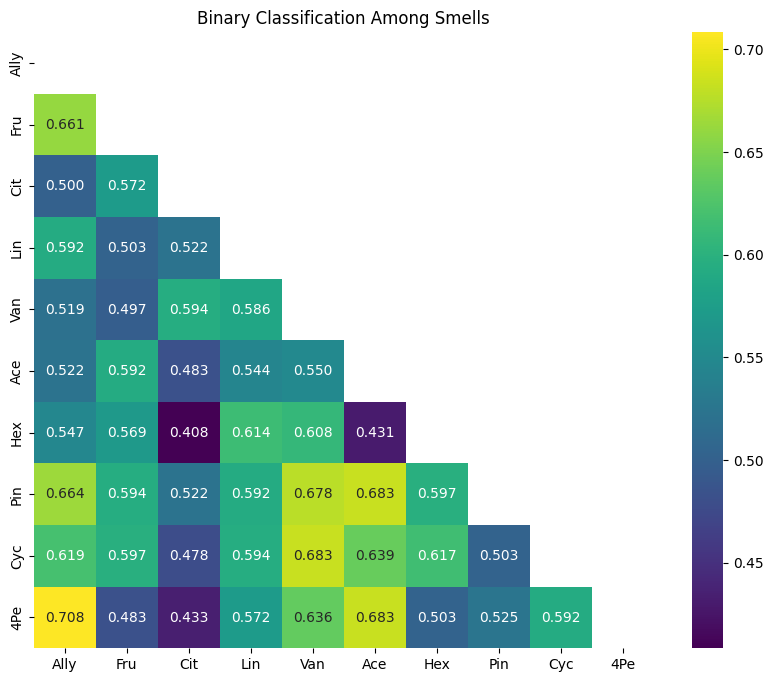

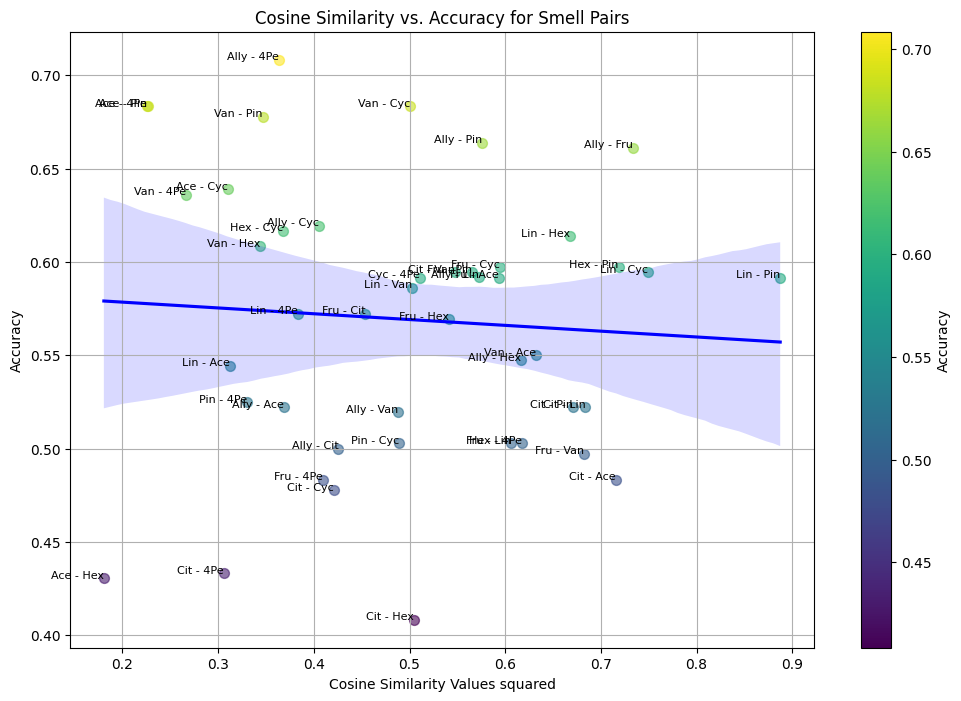

In [214]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import MinMaxScaler
import mat73
from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd

# Initialize lists to store results
all_labels_array = np.array(all_labels)

# Initialize lists to store results
pairwise_scores = []

# Iterate over all possible pairs of unique smells
for smell1, smell2 in combinations(unique_smell_ids, 2):
    # Filter data for the current pair of smells
    indices = np.where((all_labels_array == smell1) | (all_labels_array == smell2))[0]
    pair_features = all_features_matrix[indices]
    pair_labels = all_labels_array[indices]  # Direct numpy indexing
    
    # Train SVM model with cross-validation
    svm_pipeline = make_pipeline(PCA(n_components=2), SVC(kernel='rbf', C=1))
    scores = cross_val_score(svm_pipeline, pair_features, pair_labels, cv=5)
    
    # Store the cross-validation scores for the pair
    pairwise_scores.append((smell1, smell2, scores.mean(), scores.std()))

# Dictionary for smell ID to label conversion
d = {2: 'Ally', 3: 'Fru', 6: 'Cit', 7: 'Lin', 9: 'Van', 10: 'Ace', 16: 'Hex', 17: 'Pin', 21: 'Cyc', 22: '4Pe'}

# Encode smell IDs using the dictionary
encoded_smell_ids = [d[id] for id in unique_smell_ids]

# Initialize a matrix to store mean accuracy values
accuracy_matrix = np.zeros((len(unique_smell_ids), len(unique_smell_ids)))

# Populate the accuracy matrix with mean accuracy values
for score in pairwise_scores:
    smell1, smell2, mean_accuracy, _ = score
    row_index = np.where(unique_smell_ids == smell1)[0][0]
    col_index = np.where(unique_smell_ids == smell2)[0][0]
    accuracy_matrix[row_index, col_index] = mean_accuracy
    accuracy_matrix[col_index, row_index] = mean_accuracy  # Symmetric matrix

# Mask out the upper triangular part of the matrix
mask = np.triu(np.ones_like(accuracy_matrix, dtype=bool))

# Plot the lower triangular part of the accuracy matrix with a different colormap
plt.figure(figsize=(10, 8))
sns.heatmap(accuracy_matrix, cmap='viridis', mask=mask, annot=True, fmt=".3f", cbar=True,
            xticklabels=encoded_smell_ids, yticklabels=encoded_smell_ids)
plt.title('Binary Classification Among Smells')
plt.show()

# Load the similarity matrix
Similarity = mat73.loadmat('/Users/ritwikghosh/Downloads/ProcData/Perception/RawData/similarity.mat')
S = Similarity['percep']
perception_similarity_values = np.mean(S, axis=0)

perception_similarity_values = perception_similarity_values.reshape(-1, 1)

# Initialize the MinMaxScaler
scaler = MinMaxScaler(feature_range=(0, 1))

# Fit the scaler to your data and transform it
scaled_values = scaler.fit_transform(perception_similarity_values)

# If you want to reshape it back to a 1D array
perception_similarity_values = scaled_values.flatten()

# Assuming features_df is already defined
# Example features_df (replace this with your actual data)
# features_df = pd.DataFrame(np.random.rand(800, 10), columns=['Ally', 'Fru', 'Cit', 'Lin', 'Van', 'Ace', 'Hex', 'Pin', 'Cyc', '4Pe'])

# Calculate cosine similarity among the smell pairs
cosine_similarity_values = []
smell_names = features_df.columns
for smell1, smell2 in combinations(smell_names, 2):
    features1 = features_df[smell1].values.reshape(1, -1)
    features2 = features_df[smell2].values.reshape(1, -1)
    cos_sim = cosine_similarity(features1, features2)[0, 0]
    cosine_similarity_values.append(cos_sim)

# Convert cosine similarity values to a numpy array
cosine_similarity_values = np.array(cosine_similarity_values)

cosine_similarity_values = cosine_similarity_values ** 0.5

# Define the order of smell pairs
pair_names = ['Ally - Fru', 'Ally - Cit', 'Ally - Lin', 'Ally - Van', 'Ally - Ace', 'Ally - Hex', 'Ally - Pin', 'Ally - Cyc', 'Ally - 4Pe', 
              'Fru - Cit', 'Fru - Lin', 'Fru - Van', 'Fru - Ace', 'Fru - Hex', 'Fru - Pin', 'Fru - Cyc', 'Fru - 4Pe', 
              'Cit - Lin', 'Cit - Van', 'Cit - Ace', 'Cit - Hex', 'Cit - Pin', 'Cit - Cyc', 'Cit - 4Pe', 
              'Lin - Van', 'Lin - Ace', 'Lin - Hex', 'Lin - Pin', 'Lin - Cyc', 'Lin - 4Pe', 
              'Van - Ace', 'Van - Hex', 'Van - Pin', 'Van - Cyc', 'Van - 4Pe', 
              'Ace - Hex', 'Ace - Pin', 'Ace - Cyc', 'Ace - 4Pe', 
              'Hex - Pin', 'Hex - Cyc', 'Hex - 4Pe', 
              'Pin - Cyc', 'Pin - 4Pe', 'Cyc - 4Pe']

# Extract accuracy values for each pair
accuracy_values = []
for smell1, smell2 in combinations(encoded_smell_ids, 2):
    row_index = encoded_smell_ids.index(smell1)
    col_index = encoded_smell_ids.index(smell2)
    accuracy_values.append(accuracy_matrix[row_index, col_index])

# Create a colormap
colormap = plt.cm.viridis

# Plot the cosine similarity values against accuracy values with color shading
plt.figure(figsize=(12, 8))
ax = plt.gca()  # Get current axes

# Use seaborn to create a scatter plot with color shading based on accuracy values
norm = plt.Normalize(vmin=min(accuracy_values), vmax=max(accuracy_values))
colors = [colormap(norm(value)) for value in accuracy_values]
for i, pair_name in enumerate(pair_names):
    plt.scatter(cosine_similarity_values[i], accuracy_values[i], color=colors[i], s=50, alpha=0.6)

# Add color bar to indicate accuracy
sm = plt.cm.ScalarMappable(cmap=colormap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Accuracy')

# Fit the trend line using seaborn regplot
sns.regplot(x=cosine_similarity_values, y=accuracy_values, scatter=False, ax=ax, color='blue')

# Annotate the points with pair names
for i, pair_name in enumerate(pair_names):
    plt.annotate(pair_name, (cosine_similarity_values[i], accuracy_values[i]), fontsize=8, ha='right')

plt.xlabel('Cosine Similarity Values squared')
plt.ylabel('Accuracy')
plt.title('Cosine Similarity vs. Accuracy for Smell Pairs')
plt.grid(True)
plt.show()


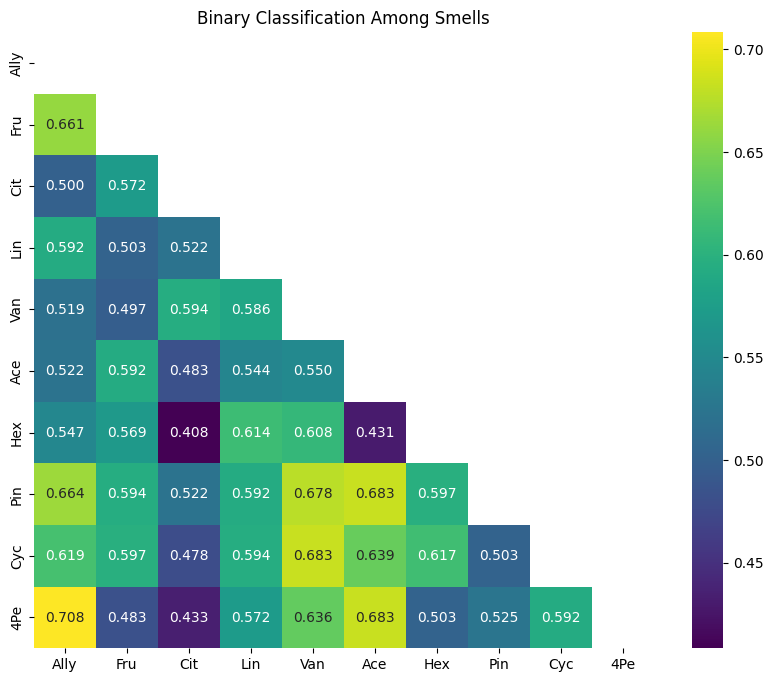

In [215]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import make_pipeline

# Initialize lists to store results
all_labels_array = np.array(all_labels)

# Initialize lists to store results
pairwise_scores = []

# Iterate over all possible pairs of unique smells
for smell1, smell2 in combinations(unique_smell_ids, 2):
    # Filter data for the current pair of smells
    indices = np.where((all_labels_array == smell1) | (all_labels_array == smell2))[0]
    pair_features = all_features_matrix[indices]
    pair_labels = all_labels_array[indices]  # Direct numpy indexing
    
    # Train SVM model with cross-validation
    svm_pipeline = make_pipeline(PCA(n_components=2), SVC(kernel='rbf', C=1))
    scores = cross_val_score(svm_pipeline, pair_features, pair_labels, cv=5)
    
    # Store the cross-validation scores for the pair
    pairwise_scores.append((smell1, smell2, scores.mean(), scores.std()))

# Print the pairwise classification results


# Dictionary for smell ID to label conversion
d = {2: 'Ally', 3: 'Fru', 6: 'Cit', 7: 'Lin', 9: 'Van', 10: 'Ace', 16: 'Hex', 17: 'Pin', 21: 'Cyc', 22: '4Pe'}

# Encode smell IDs using the dictionary
encoded_smell_ids = [d[id] for id in unique_smell_ids]

# Initialize a matrix to store mean accuracy values
accuracy_matrix = np.zeros((len(unique_smell_ids), len(unique_smell_ids)))

# Populate the accuracy matrix with mean accuracy values
for score in pairwise_scores:
    smell1, smell2, mean_accuracy, _ = score
    row_index = np.where(unique_smell_ids == smell1)[0][0]
    col_index = np.where(unique_smell_ids == smell2)[0][0]
    accuracy_matrix[row_index, col_index] = mean_accuracy
    accuracy_matrix[col_index, row_index] = mean_accuracy  # Symmetric matrix

# Mask out the upper triangular part of the matrix
mask = np.triu(np.ones_like(accuracy_matrix, dtype=bool))

# Plot the lower triangular part of the accuracy matrix with a different colormap
plt.figure(figsize=(10, 8))
sns.heatmap(accuracy_matrix, cmap='viridis', mask=mask, annot=True, fmt=".3f", cbar=True,
            xticklabels=encoded_smell_ids, yticklabels=encoded_smell_ids)
plt.title('Binary Classification Among Smells')
plt.show()


In [1018]:
import numpy as np
import pandas as pd
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.model_selection import cross_val_score
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
from itertools import combinations

# Initialize PCA with n_components=15
pca = PCA(n_components=9)

# Initialize lists to store results
pairwise_scores = []

# Iterate over all possible pairs of unique smells
for smell1, smell2 in combinations(unique_smell_ids, 2):
    # Filter data for the current pair of smells
    indices = np.where((all_labels_array == smell1) | (all_labels_array == smell2))[0]
    pair_features = all_features_matrix[indices]
    pair_labels = all_labels_array[indices]  # Direct numpy indexing
    
    # Apply PCA transformation
    pair_features_pca = pca.fit_transform(pair_features)
    
    # Train ExtraTreesClassifier model with cross-validation
    extra_trees_model = ExtraTreesClassifier(n_estimators=50, random_state=42, max_depth=6)
    scores = cross_val_score(extra_trees_model, pair_features_pca, pair_labels, cv=5)
    
    # Store the cross-validation scores for the pair
    mean_accuracy = round(scores.mean(), 3)
    std_dev = round(scores.std(), 3)
    pairwise_scores.append((smell1, smell2, mean_accuracy, std_dev))

# Create a DataFrame from the list of results
result_df = pd.DataFrame(pairwise_scores, columns=['Smell1', 'Smell2', 'Mean Accuracy', 'Standard Deviation'])

# Save the DataFrame to a CSV file
result_df.to_csv('pairwise_classification_results_extra_trees_with_pca.csv', index=False)

print("Pairwise classification results using ExtraTreesClassifier with PCA saved to CSV.")

Pairwise classification results using ExtraTreesClassifier with PCA saved to CSV.


In [1019]:
result_df['Mean Accuracy'].mean()

0.5329333333333334

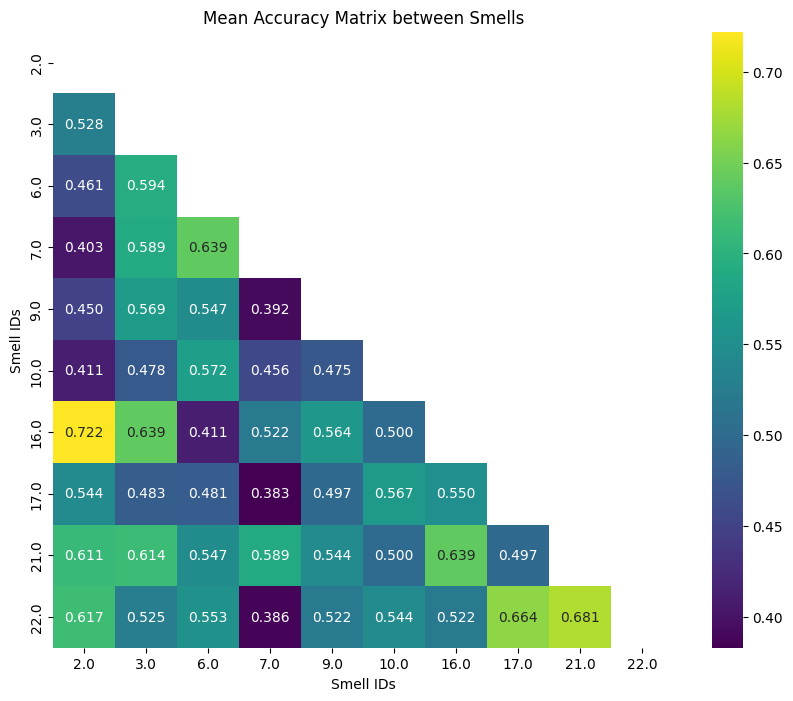

In [907]:
accuracy_matrix = np.zeros((len(unique_smell_ids), len(unique_smell_ids)))

# Populate the accuracy matrix with mean accuracy values
for score in pairwise_scores:
    smell1, smell2, mean_accuracy, _ = score
    row_index = np.where(unique_smell_ids == smell1)[0][0]
    col_index = np.where(unique_smell_ids == smell2)[0][0]
    accuracy_matrix[row_index, col_index] = mean_accuracy
    accuracy_matrix[col_index, row_index] = mean_accuracy  # Symmetric matrix

# Mask out the upper triangular part of the matrix
mask = np.triu(np.ones_like(accuracy_matrix, dtype=bool))

# Plot the lower triangular part of the accuracy matrix with a different colormap
plt.figure(figsize=(10, 8))
sns.heatmap(accuracy_matrix, cmap='viridis', mask=mask, annot=True, fmt=".3f", cbar=True,
            xticklabels=unique_smell_ids, yticklabels=unique_smell_ids)
plt.title('Mean Accuracy Matrix between Smells')
plt.xlabel('Smell IDs')
plt.ylabel('Smell IDs')
plt.show()

In [800]:
d=pd.read_csv('pairwise_classification_results_extra_trees.csv')

In [598]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report

# Initialize arrays to store all features and labels
all_features = []
all_labels = []

# Iterate over each subject's data
for data in all_subject_data_with_features:
    # Extract only the second column of features
    features = data['features'][:, 2]

    # Append features and labels to the lists
    all_features.append(features)
    all_labels.append(data['smell_id'])

all_features_matrix = np.vstack(all_features)

svm_pipeline = make_pipeline(PCA(n_components=4), SVC(kernel='rbf'))
scores = cross_val_score(svm_pipeline, all_features_matrix, all_labels, cv=10)

# Print the accuracy scores
print("Accuracy scores:", scores)

# Print the mean accuracy and standard deviation
print("Mean accuracy:", scores.mean())
print("Standard deviation:", scores.std())


Accuracy scores: [0.22727273 0.13636364 0.18181818 0.09090909 0.22727273 0.
 0.18181818 0.13636364 0.18181818 0.18181818]
Mean accuracy: 0.15454545454545454
Standard deviation: 0.06492207662311682


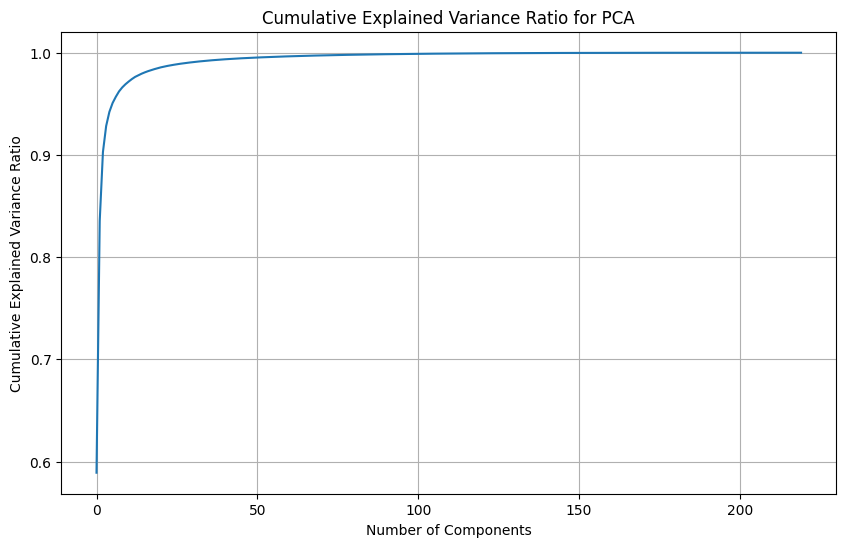

In [622]:
pca = PCA()
pca.fit(all_features_matrix)

# Plot the cumulative explained variance ratio
plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance Ratio')
plt.title('Cumulative Explained Variance Ratio for PCA')
plt.grid(True)
plt.show()

In [79]:
# Define the channels and their corresponding names
channel_names = {37: 'Fz'}
channels = [37]

# Define the path to the directory containing all subject data
data_directory = '/Users/ritwikghosh/Downloads/ProcData/EEG/Signals'

# Initialize a list to store dictionaries for each subject
all_subject_Fz = []

# Iterate over each subject directory
for subject_folder in os.listdir(data_directory):
    subject_folder_path = os.path.join(data_directory, subject_folder)
    print(subject_folder)
    if not os.path.isdir(subject_folder_path):
        continue  # Skip non-directory items
    
    subject_data_path = os.path.join(subject_folder_path, 'erp_v1.mat')
    
    # Load the data for the current subject
    try:
        data_dict = mat73.loadmat(subject_data_path)
    except NotImplementedError:
        # Skip non-MATLAB v7.3 files
        continue
    
    # Extract relevant information
    eeg_data = data_dict['erp']  # EEG data
    log_data = data_dict['log']  # Log data
    
    # Find unique smell ids
    unique_smell_ids = np.unique(log_data[:, 1])
    
    # Iterate over each channel
    for channel_idx in channels:
        # Iterate over each unique smell id
        for smell_id in unique_smell_ids:
            # Find indices of trials corresponding to the current smell_id
            trial_indices = np.where(log_data[:, 1] == smell_id)[0]

            # Initialize an array to store EEG signals for the current smell_id
            eeg_signals = np.zeros((eeg_data.shape[1],))

            # Iterate over each trial for the current smell_id
            for trial_idx in trial_indices:
                # Extract EEG signal for the specified channel and trial
                eeg_signal = eeg_data[channel_idx, :, trial_idx]

                # Add the EEG signal to the array
                eeg_signals += eeg_signal

            # Calculate the mean EEG signal for the current smell_id
            mean_eeg_signal = eeg_signals / len(trial_indices)

            # Apply feature extraction
            STE = SingleTakensEmbedding(
                parameters_type="search", n_jobs=-1, time_delay=10, dimension=5, stride=1
            )
            y_embedded = STE.fit_transform(mean_eeg_signal[1100:1850])

            homology_dimensions = [0, 1, 2]
            VR = VietorisRipsPersistence(
                metric="euclidean",
                homology_dimensions=homology_dimensions,
                n_jobs=-1,
                collapse_edges=True,
            )
            diagram = VR.fit_transform([y_embedded])
            Bc = BettiCurve(n_bins=300)
            features = Bc.fit_transform(diagram)[0].T

            # Add the data to the list
            all_subject_Fz.append({
                'subject': subject_folder,
                'channel': channel_names[channel_idx],
                'smell_id': smell_id,
                'features': features
            })

# Print the result



KM32_s12


KeyboardInterrupt: 

In [424]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import classification_report

# Initialize arrays to store all features and labels
all_features = []
all_labels = []

# Iterate over each subject's data
for data in all_subject_Fz:
    # Extract only the second column of features
    features = data['features'][:,2]

    # Append features and labels to the lists
    all_features.append(features)
    all_labels.append(data['smell_id'])

all_features = np.vstack(all_features)

In [428]:
from sklearn.model_selection import cross_val_score

# Train SVM model with cross-validation
svm_pipeline = make_pipeline(PCA(n_components=20),SVC(kernel='rbf'))
scores = cross_val_score(svm_pipeline, all_features, all_labels, cv=5)

# Print the accuracy scores
print("Accuracy scores:", scores)

# Print the mean accuracy and standard deviation
print("Mean accuracy:", scores.mean())
print("Standard deviation:", scores.std())

Accuracy scores: [0.13636364 0.15909091 0.11363636 0.15909091 0.11363636]
Mean accuracy: 0.13636363636363635
Standard deviation: 0.020327890704543543


In [429]:
import numpy as np
from sklearn.decomposition import PCA
from scipy.spatial.distance import pdist, squareform

# Initialize a dictionary to store feature vectors for each smell
smell_features_dict = {smell_id: [] for smell_id in range(10)}

# Iterate over each subject's data
for subject_data in all_subject_data_with_features:
    # Get features and smell IDs
    features = subject_data['features'][:, 1]
    smell_ids = subject_data['smell_id']
    
    # Iterate over each unique smell ID
    for smell_id in np.unique(smell_ids):
        # Extract feature vectors corresponding to the current smell ID
        smell_features = features[smell_ids == smell_id]
        
        # Append the feature vectors to the dictionary
        smell_features_dict[smell_id].extend(smell_features)

# Convert the dictionary values to numpy arrays
for smell_id in smell_features_dict:
    smell_features_dict[smell_id] = np.array(smell_features_dict[smell_id])

# Initialize a dictionary to store PCA-transformed feature vectors for each smell
pca_features_dict = {}

# Apply PCA to reduce the dimensionality to 3 components for each smell
for smell_id in smell_features_dict:
    # Apply PCA to the feature vectors with 3 components
    pca = PCA(n_components=3)
    pca_transformed = pca.fit_transform(smell_features_dict[smell_id])
    
    # Store the PCA-transformed feature vectors
    pca_features_dict[smell_id] = pca_transformed

# Initialize a dictionary to store distance matrices for each smell
distance_matrices_dict = {}

# Compute the distance matrix for each smell
for smell_id1 in pca_features_dict:
    # Initialize a matrix to store pairwise distances between PCA-transformed feature vectors
    distance_matrix = np.zeros((10, 10))
    
    for smell_id2 in pca_features_dict:
        # Calculate pairwise distances between PCA-transformed feature vectors for each pair of smells
        distances = pdist(np.vstack([pca_features_dict[smell_id1], pca_features_dict[smell_id2]]))
        
        # Store the distance in the distance matrix
        distance_matrix[smell_id1, smell_id2] = distances[0]
        distance_matrix[smell_id2, smell_id1] = distances[0]  # Distance matrix is symmetric
        
    # Store the distance matrix for the current smell
    distance_matrices_dict[smell_id1] = distance_matrix

# Now distance_matrices_dict contains the distance matrices for each smell


KeyError: 10.0

In [3]:
all_subject_data_with_features[0]['features'].shape

NameError: name 'all_subject_data_with_features' is not defined

In [434]:
import numpy as np
np.unique(data_dict['log'][:,1])

array([ 2.,  3.,  6.,  7.,  9., 10., 16., 17., 21., 22.])

In [467]:
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import normalize

# Initialize a dictionary to store features for each smell
smell_features_dict = {}

# Iterate over each unique smell ID
unique_smell_ids = [2.,  3.,  6.,  7.,  9., 10., 16., 17., 21., 22.]
for smell_id in unique_smell_ids:
    # Initialize a list to store features for this smell
    smell_features = []
    
    # Iterate over each subject's data
    for data in all_subject_data_with_features:
        if data['smell_id'] == smell_id:
            # Extract the second column from the 'features' array
            features = data['features'][:, 1]
            # Normalize the features
            normalized_features = normalize(features.reshape(1, -1))
            smell_features.append(normalized_features)
    
    # Stack the features to create a matrix for this smell
    smell_features_matrix = np.vstack(smell_features)
    
    # Apply PCA with 3 components
    #pca = PCA(n_components=3)
    #pca_transformed = pca.fit_transform(smell_features_matrix)
    # Store the PCA-transformed features for this smell
    smell_features_dict[smell_id] = smell_features_matrix


# Initialize a matrix to store pairwise distances between smells
distance_matrix = np.zeros((len(unique_smell_ids), len(unique_smell_ids)))

# Compute the pairwise distances between PCA-transformed matrices for each pair of smells
for i in range(len(unique_smell_ids)):
    for j in range(len(unique_smell_ids)):
        if i <= j:
            distances = pdist(np.vstack([smell_features_dict[unique_smell_ids[i]], smell_features_dict[unique_smell_ids[j]]]))
            distance_matrix[i, j] = distances[0]
            if i != j:
                distance_matrix[j, i] = distances[0]
# Now distance_matrix contains the distance matrix between each pair of smells


In [468]:
from scipy.spatial.distance import cdist
smell_ids = list(smell_features_dict.keys())

# Number of subjects
num_subjects = smell_features_dict[smell_ids[0]].shape[0]

# Initialize a dictionary to store distance matrices for each subject
distance_matrices = {}

# Iterate over each subject
for subject_idx in range(num_subjects):
    # Initialize a 10x10 distance matrix for the current subject
    subject_distances = np.zeros((len(smell_ids), len(smell_ids)))
    
    # Iterate over all pairs of smells
    for i, smell1_id in enumerate(smell_ids):
        for j, smell2_id in enumerate(smell_ids):
            # Compute the pairwise Euclidean distance between vectors for the current subject
            distances = cdist(smell_features_dict[smell1_id][subject_idx:subject_idx+1],
                              smell_features_dict[smell2_id][subject_idx:subject_idx+1], 
                              metric='euclidean')
            # Store the distance in the corresponding position of the matrix
            subject_distances[i, j] = distances[0][0]

    # Store the distance matrix for the current subject
    distance_matrices[f"Subject_{subject_idx+1}"] = subject_distances

In [2]:
distance_matrices['Subject_1']

NameError: name 'distance_matrices' is not defined

In [455]:
cdist(smell_features_dict[2.0][0],smell_features_dict[3.0][0])

ValueError: XA must be a 2-dimensional array.

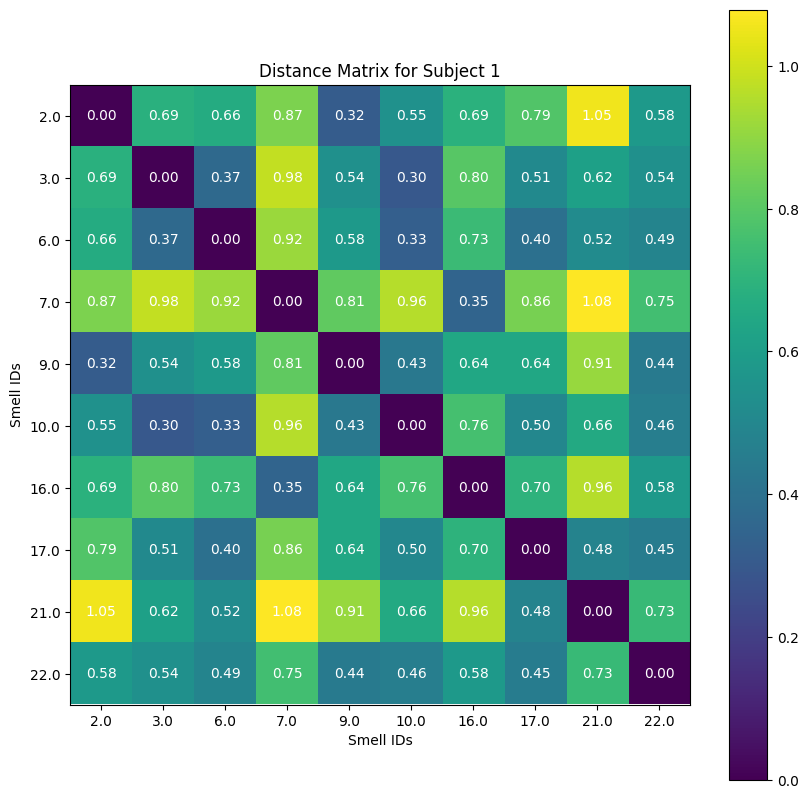

In [470]:
import matplotlib.pyplot as plt

# Extract distance matrix for Subject 1
subject_1_distances = distance_matrices['Subject_1']

# Get the smell IDs
smell_ids = list(smell_features_dict.keys())

# Plot the distance matrix
plt.figure(figsize=(10, 10))
plt.imshow(subject_1_distances, cmap='viridis', interpolation='nearest')

# Add color bar
plt.colorbar()

# Set the x and y axis labels
plt.xticks(ticks=range(len(smell_ids)), labels=[str(smell_id) for smell_id in smell_ids])
plt.yticks(ticks=range(len(smell_ids)), labels=[str(smell_id) for smell_id in smell_ids])

# Add text annotations for the values
for i in range(len(smell_ids)):
    for j in range(len(smell_ids)):
        plt.text(j, i, '{:.2f}'.format(subject_1_distances[i, j]),
                 horizontalalignment='center',
                 verticalalignment='center',
                 color='white')

# Add title and labels
plt.title('Distance Matrix for Subject 1')
plt.xlabel('Smell IDs')
plt.ylabel('Smell IDs')

# Display the plot
plt.show()


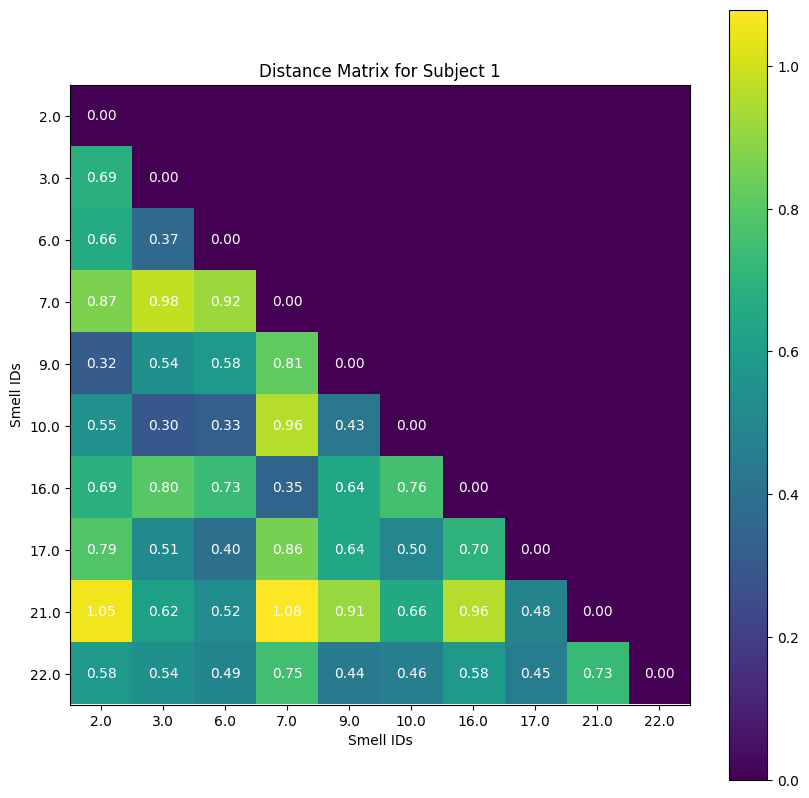

In [471]:
import numpy as np
import matplotlib.pyplot as plt

# Extract distance matrix for Subject 1
subject_1_distances = distance_matrices['Subject_1']

# Mask the upper triangular part
subject_1_distances_masked = np.tril(subject_1_distances)

# Get the smell IDs
smell_ids = list(smell_features_dict.keys())

# Plot the distance matrix
plt.figure(figsize=(10, 10))
plt.imshow(subject_1_distances_masked, cmap='viridis', interpolation='nearest')

# Add color bar
plt.colorbar()

# Set the x and y axis labels
plt.xticks(ticks=range(len(smell_ids)), labels=[str(smell_id) for smell_id in smell_ids])
plt.yticks(ticks=range(len(smell_ids)), labels=[str(smell_id) for smell_id in smell_ids])

# Add text annotations for the values
for i in range(len(smell_ids)):
    for j in range(len(smell_ids)):
        if j <= i:  # Plot values only for the lower triangular part
            plt.text(j, i, '{:.2f}'.format(subject_1_distances[i, j]),
                     horizontalalignment='center',
                     verticalalignment='center',
                     color='white')

# Add title and labels
plt.title('Distance Matrix for Subject 1')
plt.xlabel('Smell IDs')
plt.ylabel('Smell IDs')

# Display the plot
plt.show()


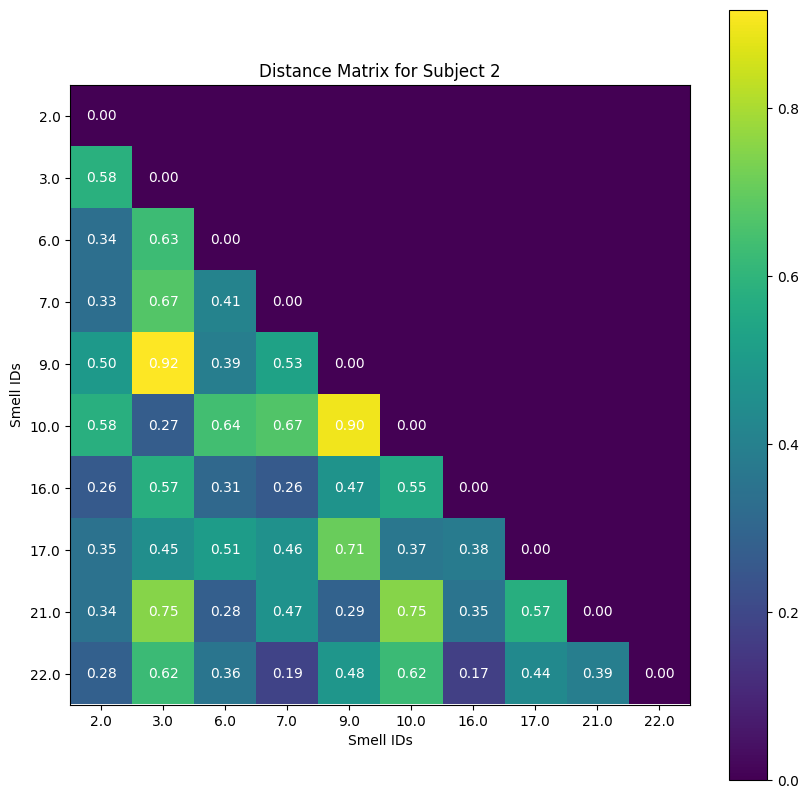

In [472]:
import numpy as np
import matplotlib.pyplot as plt

# Extract distance matrix for Subject 1
subject_1_distances = distance_matrices['Subject_2']

# Mask the upper triangular part
subject_1_distances_masked = np.tril(subject_1_distances)

# Get the smell IDs
smell_ids = list(smell_features_dict.keys())

# Plot the distance matrix
plt.figure(figsize=(10, 10))
plt.imshow(subject_1_distances_masked, cmap='viridis', interpolation='nearest')

# Add color bar
plt.colorbar()

# Set the x and y axis labels
plt.xticks(ticks=range(len(smell_ids)), labels=[str(smell_id) for smell_id in smell_ids])
plt.yticks(ticks=range(len(smell_ids)), labels=[str(smell_id) for smell_id in smell_ids])

# Add text annotations for the values
for i in range(len(smell_ids)):
    for j in range(len(smell_ids)):
        if j <= i:  # Plot values only for the lower triangular part
            plt.text(j, i, '{:.2f}'.format(subject_1_distances[i, j]),
                     horizontalalignment='center',
                     verticalalignment='center',
                     color='white')

# Add title and labels
plt.title('Distance Matrix for Subject 2')
plt.xlabel('Smell IDs')
plt.ylabel('Smell IDs')

# Display the plot
plt.show()


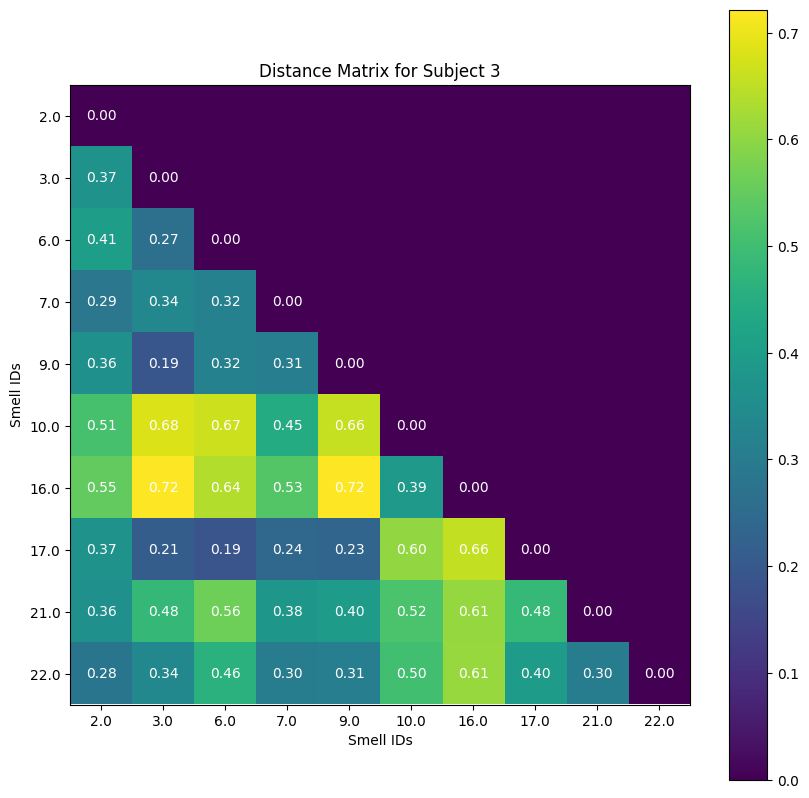

In [473]:
import numpy as np
import matplotlib.pyplot as plt

# Extract distance matrix for Subject 1
subject_1_distances = distance_matrices['Subject_3']

# Mask the upper triangular part
subject_1_distances_masked = np.tril(subject_1_distances)

# Get the smell IDs
smell_ids = list(smell_features_dict.keys())

# Plot the distance matrix
plt.figure(figsize=(10, 10))
plt.imshow(subject_1_distances_masked, cmap='viridis', interpolation='nearest')

# Add color bar
plt.colorbar()

# Set the x and y axis labels
plt.xticks(ticks=range(len(smell_ids)), labels=[str(smell_id) for smell_id in smell_ids])
plt.yticks(ticks=range(len(smell_ids)), labels=[str(smell_id) for smell_id in smell_ids])

# Add text annotations for the values
for i in range(len(smell_ids)):
    for j in range(len(smell_ids)):
        if j <= i:  # Plot values only for the lower triangular part
            plt.text(j, i, '{:.2f}'.format(subject_1_distances[i, j]),
                     horizontalalignment='center',
                     verticalalignment='center',
                     color='white')

# Add title and labels
plt.title('Distance Matrix for Subject 3')
plt.xlabel('Smell IDs')
plt.ylabel('Smell IDs')

# Display the plot
plt.show()
